# Analyze hmov unit and model info against unit info dataframes from other experiments

## TODO
- restrict to dLGN
- for OMI: exclude control mouse (m_genotype='-/-')

## Setup

### Start DJD
Run main.py as interactive (-i) module (-m) and remotely (-r)\
NOTE: any code inside the DJD-executing cell other than the executing line is not allowed

In [1]:
run -im djd.main -- --dbname=dj_hmov --user=write

Connecting write@huxley.neuro.bzm:3306
Connected to database 'dj_hmov' as 'write@10.153.173.165'


In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

from djd import hmov_models
from djd import hmov_unit
from djd.hmov_models import get_best_model
from djd.plot import cm2inch
from l6s import l6s_utils # Layer 6 suppression code repo with utility functions for plotting unit overview 

ImportError: cannot import name 'hmov_models' from 'djd' (/Users/ybauer/code/djd/djd/__init__.py)

In [6]:
%load_ext autoreload
%autoreload 2

In [7]:
# Dynamically update general pars (use if not updating from modified matplotlibrc)
plt.rcParams.update({
    'figure.dpi': 150,
    'axes.labelsize': 'large',    
    'figure.max_open_warning': 0, 
    'font.sans-serif': ['Arial'],
    'pdf.fonttype': 42, # make text editable (otherwise saved as non-text path/shape)
    'ps.fonttype': 42, # make text editable (otherwise saved as non-text path/shape)
    })

# HmovUnit() parameters

## Get HmovUnit df

In [8]:
# Create Hmov Unit DataFrame
hmovu_df = HmovUnit().df
hmovu_df.columns = hmovu_df.columns.str.replace(r'hmu_', '')  # rmv prefix 'hmu_' and 'hm_' from column names (better than lstrip)
hmovu_df.columns = hmovu_df.columns.str.replace(r'hm_', '')

# Add genotype info
genotype = pd.DataFrame(Mouse().fetch(dj.key, 'm_genotype', as_dict=True))
hmovu_df = hmovu_df.merge(genotype, on='m', how='left')
# hmovu_df = hmovu_df[hmovu_df.m_genotype=='+/-']  # optionally restrict to Ntsr1-Cre pos mice

# Add region info
region = pd.DataFrame(Series().fetch(dj.key, 's_region', as_dict=True))
hmovu_df = hmovu_df.merge(region, on=['m', 's'], how='left')
hmovu_df = hmovu_df[hmovu_df.s_region=='LGN']  # optionally restrict to LGN

hmovu_df

,m,s,e,u,version,seq_num,fr_mean_e,fr_var_e,fr_mean_stim,fr_mean_stim_ctrl,...,omi_e,omi_stim,omi_spont,rmi_e,oracle,explainable_var,sta_corrected,ts,m_genotype,s_region
0,Ntsr1Cre_2019_0007,6,9,1,3,1,3.187930,0.099487,3.175080,3.134990,...,0.017330,0.016479,0.023492,0.070960,0.079670,0.048276,"[[0.0023613724447980877, 0.0030373545108378502...",2021-06-02 18:44:47,+/-,LGN
1,Ntsr1Cre_2019_0007,6,9,2,3,1,0.314107,0.005292,0.326602,0.270756,...,0.155874,0.137091,0.303167,-0.009540,-0.029886,-0.000538,"[[0.0022682736316046795, 0.0018539165972493027...",2021-06-02 18:45:08,+/-,LGN
2,Ntsr1Cre_2019_0007,6,9,3,3,1,0.715252,0.015358,0.723626,0.717029,...,0.004612,-0.002465,0.302003,-0.095041,0.021725,0.001476,"[[-0.0008413160603633341, -0.00092340739772293...",2021-06-02 18:45:28,+/-,LGN
3,Ntsr1Cre_2019_0007,6,9,4,3,1,0.219647,0.003611,0.225128,0.192709,...,0.142684,0.121808,0.287607,-0.106221,-0.010738,-0.000069,"[[-0.0006752949672300182, -0.00017738839294400...",2021-06-02 18:45:49,+/-,LGN
4,Ntsr1Cre_2019_0007,6,9,5,3,1,0.484936,0.007475,0.485190,0.502309,...,-0.026113,-0.035539,0.136408,0.197597,0.055330,0.001286,"[[0.0011552864206164151, 0.0017550234715710544...",2021-06-02 18:46:09,+/-,LGN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
154,Ntsr1Cre_2020_0002,6,6,28,3,9,21.182600,0.390978,21.326800,20.349600,...,0.033922,0.039031,-0.027584,0.073500,0.723163,2.655950,"[[-0.0001962279323555402, -0.00045729835148366...",2021-06-02 20:45:52,+/-,LGN
155,Ntsr1Cre_2020_0002,6,6,30,3,9,14.707800,0.186528,14.671100,15.117300,...,-0.024081,-0.027620,0.033038,0.059101,0.081442,0.075420,"[[-0.0002837470271844153, -0.00026337279744968...",2021-06-02 20:46:15,+/-,LGN
156,Ntsr1Cre_2020_0002,6,6,33,3,9,19.150300,0.299813,19.371000,19.642300,...,-0.025478,-0.025492,-0.019475,0.024734,0.044743,0.040886,"[[-9.081468692775929e-05, 1.0027847660187827e-...",2021-06-02 20:46:39,+/-,LGN
157,Ntsr1Cre_2020_0002,6,6,38,3,9,13.873600,0.203965,14.008400,14.568300,...,-0.050377,-0.049661,-0.056418,0.065776,0.034250,0.028230,"[[-0.0005702388788273241, -0.00044365661772834...",2021-06-02 20:46:58,+/-,LGN


In [6]:
hmovu_df.columns

Index(['m', 's', 'e', 'u', 'version', 'seq_num', 'fr_mean_e', 'fr_var_e', 'fr_mean_stim', 'fr_mean_stim_ctrl', 'fr_var_stim_ctrl', 'fr_mean_stim_opto', 'fr_var_stim_opto', 'fr_mean_spont_ctrl',
       'fr_var_spont_ctrl', 'fr_mean_spont_opto', 'fr_var_spont_opto', 'omi_e', 'omi_stim', 'omi_spont', 'rmi_e', 'oracle', 'explainable_var', 'sta_corrected', 'ts', 'm_genotype', 's_region'],
      dtype='object')

## HmovUnit mean firing rates (FR)
- stimulus vs spontaneous period and opto vs control

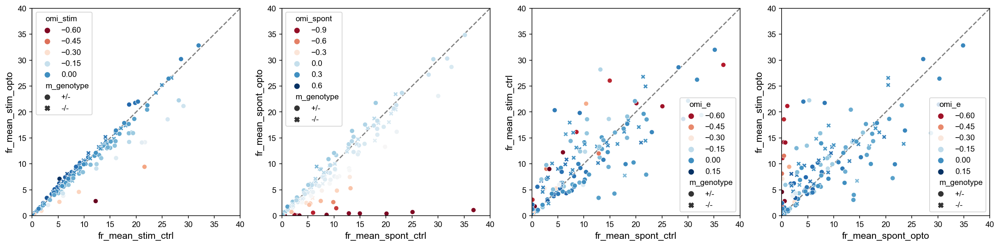

In [93]:
# Plot firing rate scatter plots
# fig, axs = plt.subplots(1,4, figsize=(25,10), sharex=True, sharey=False)
fig, axs = plt.subplots(1,4, figsize=cm2inch((55,25)), dpi=150, sharex=True, sharey=False)
for ax in axs: ax.set_aspect('equal')

# hmovu_df.plot.scatter(x='fr_mean_stim_ctrl', y='fr_mean_stim_opto', hue='omi_stim', ax=axs[0]);
sns.scatterplot(data=hmovu_df, x='fr_mean_stim_ctrl', y='fr_mean_stim_opto', hue='omi_stim', palette='RdBu', style='m_genotype', ax=axs[0])#, hue_norm=(-0.15,0.15))
sns.scatterplot(data=hmovu_df, x='fr_mean_spont_ctrl', y='fr_mean_spont_opto', hue='omi_spont', palette='RdBu', style='m_genotype', ax=axs[1])
sns.scatterplot(data=hmovu_df, x='fr_mean_spont_ctrl', y='fr_mean_stim_ctrl', hue='omi_e', palette='RdBu', style='m_genotype', ax=axs[2])
sns.scatterplot(data=hmovu_df, x='fr_mean_spont_opto', y='fr_mean_stim_opto', hue='omi_e', palette='RdBu', style='m_genotype', ax=axs[3])

# axs[0].set_ylim(axs[0].get_xlim())
axs[0].set_ylim([0,40])
axs[0].set_xlim([0,40])
axs[1].set_ylim(axs[0].get_ylim())
axs[2].set_ylim(axs[0].get_ylim())
axs[3].set_ylim(axs[0].get_ylim())

for ax in axs: ax.plot([0, 1], [0, 1], color='grey', linestyle='--', transform=ax.transAxes, zorder=-1)
# for ax in axs: ax.plot([0, 40], [0, 40], color='grey', linestyle='--', zorder=-1)

## HmovUnit FR variance

In [8]:
hmovu_df.columns

Index(['m', 's', 'e', 'u', 'version', 'seq_num', 'fr_mean_e', 'fr_var_e', 'fr_mean_stim', 'fr_mean_stim_ctrl', 'fr_var_stim_ctrl', 'fr_mean_stim_opto', 'fr_var_stim_opto', 'fr_mean_spont_ctrl',
       'fr_var_spont_ctrl', 'fr_mean_spont_opto', 'fr_var_spont_opto', 'omi_e', 'omi_stim', 'omi_spont', 'rmi_e', 'oracle', 'explainable_var', 'sta_corrected', 'ts', 'm_genotype', 's_region'],
      dtype='object')

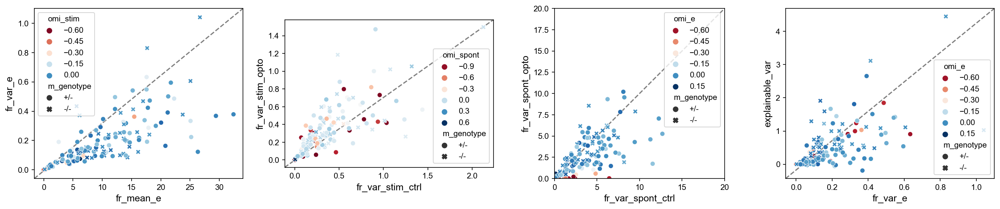

In [13]:
# Plot scatter plots
# fig, axs = plt.subplots(1,4, figsize=(25,10), sharex=True, sharey=False)
fig, axs = plt.subplots(1,4, figsize=cm2inch((55,10)), dpi=150, sharex=False, sharey=False)
# for ax in axs: ax.set_aspect('equal')

# hmovu_df.plot.scatter(x='fr_mean_stim_ctrl', y='fr_mean_stim_opto', hue='omi_stim', ax=axs[0]);
sns.scatterplot(data=hmovu_df, x='fr_mean_e', y='fr_var_e', hue='omi_stim', palette='RdBu', style='m_genotype', ax=axs[0]) # hue_norm=(-1,1)
sns.scatterplot(data=hmovu_df, x='fr_var_stim_ctrl', y='fr_var_stim_opto', hue='omi_spont', palette='RdBu', style='m_genotype', ax=axs[1])
axs[1].set_aspect('equal')
sns.scatterplot(data=hmovu_df, x='fr_var_spont_ctrl', y='fr_var_spont_opto', hue='omi_e', palette='RdBu', style='m_genotype', ax=axs[2])
axs[2].set_xlim([0,20])
axs[2].set_ylim([0,20])
axs[2].set_aspect('equal')
sns.scatterplot(data=hmovu_df, x='fr_var_e', y='explainable_var', hue='omi_e', palette='RdBu', style='m_genotype', ax=axs[3])

# sns.scatterplot(data=hmovu_df, x='fr_mean_spont_opto', y='fr_mean_stim_opto', hue='omi_e', palette='RdBu', style='m_genotype', ax=axs[3])

# axs[0].set_ylim(axs[1].get_ylim())
# axs[2].set_ylim(axs[1].get_ylim())
# axs[3].set_ylim(axs[1].get_ylim())

for ax in axs: ax.plot([0, 1], [0, 1], color='grey', linestyle='--', transform=ax.transAxes, zorder=-1)

## HmovUnit OMIs

In [93]:
hmovu_df.columns

Index(['m', 's', 'e', 'u', 'version', 'seq_num', 'fr_mean_e', 'fr_var_e', 'fr_mean_stim', 'fr_mean_stim_ctrl', 'fr_var_stim_ctrl', 'fr_mean_stim_opto', 'fr_var_stim_opto', 'fr_mean_spont_ctrl',
       'fr_var_spont_ctrl', 'fr_mean_spont_opto', 'fr_var_spont_opto', 'omi_e', 'omi_stim', 'omi_spont', 'rmi_e', 'oracle', 'explainable_var', 'sta_corrected', 'ts', 'm_genotype', 's_region'],
      dtype='object')

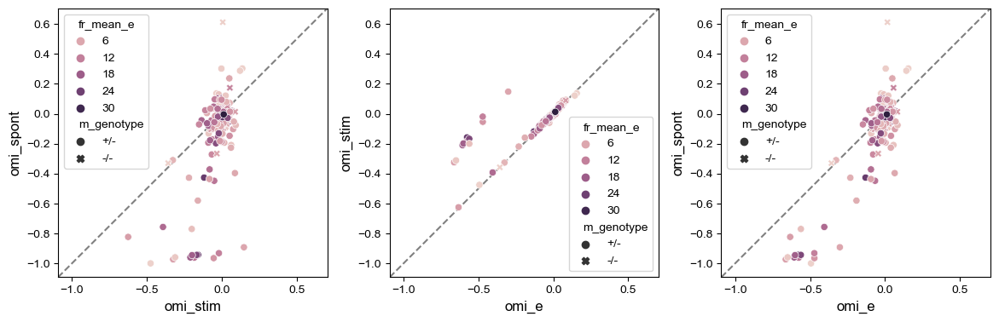

In [9]:
# Plot scatter plots
fig, axs = plt.subplots(1,3, figsize=cm2inch((30,10)), dpi=100, sharex=True)#, , figsize=cm2inch((55,25)), dpi=100figsize=cm2inch((55,25)), dpi=100, sharex=True, sharey=False)
for ax in axs: ax.set_aspect('equal')

sns.scatterplot(data=hmovu_df, x='omi_stim', y='omi_spont', hue='fr_mean_e', style='m_genotype', ax=axs[0]) # hue_norm=(-1,1)
axs[0].set_xlim(axs[0].get_ylim())

sns.scatterplot(data=hmovu_df, x='omi_e', y='omi_stim', hue='fr_mean_e', style='m_genotype', ax=axs[1]) # hue_norm=(-1,1)
axs[1].set_ylim(axs[1].get_xlim())

sns.scatterplot(data=hmovu_df, x='omi_e', y='omi_spont', hue='fr_mean_e', style='m_genotype', ax=axs[2]) # hue_norm=(-1,1)

for ax in axs: ax.plot([0, 1], [0, 1], color='grey', linestyle='--', transform=ax.transAxes, zorder=-1)

fig.tight_layout()

## HmovUnit explainable variance and oracle score

In [93]:
hmovu_df.columns

Index(['m', 's', 'e', 'u', 'version', 'seq_num', 'fr_mean_e', 'fr_var_e', 'fr_mean_stim', 'fr_mean_stim_ctrl', 'fr_var_stim_ctrl', 'fr_mean_stim_opto', 'fr_var_stim_opto', 'fr_mean_spont_ctrl',
       'fr_var_spont_ctrl', 'fr_mean_spont_opto', 'fr_var_spont_opto', 'omi_e', 'omi_stim', 'omi_spont', 'rmi_e', 'oracle', 'explainable_var', 'sta_corrected', 'ts', 'm_genotype', 's_region'],
      dtype='object')

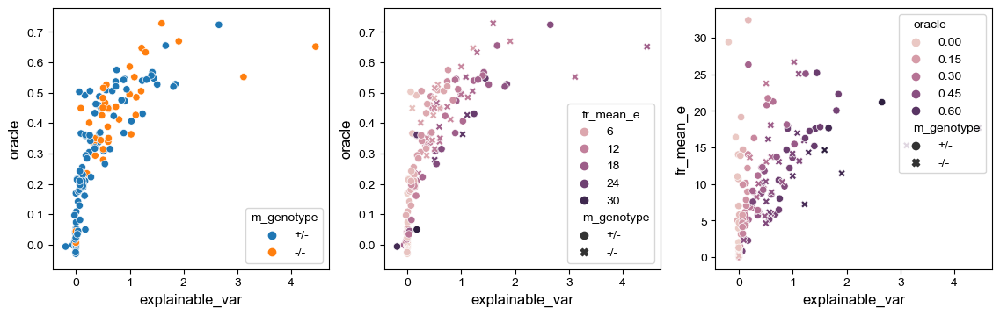

In [47]:
# fig, axs = plt.subplots(1,1, dpi=100)#, , figsize=cm2inch((55,25)), dpi=100figsize=cm2inch((55,25)), dpi=100, sharex=True, sharey=False)
fig, axs = plt.subplots(1,3, figsize=cm2inch((35,10)), dpi=100)
sns.scatterplot(data=hmovu_df, x='explainable_var', y='oracle', hue='m_genotype', ax=axs[0])
sns.scatterplot(data=hmovu_df, x='explainable_var', y='oracle', hue='fr_mean_e', style='m_genotype', ax=axs[1])
sns.scatterplot(data=hmovu_df, x='explainable_var', y='fr_mean_e', hue='oracle', style='m_genotype', ax=axs[2]) # hue_norm=(-1,1)

## HmovUnit RMI

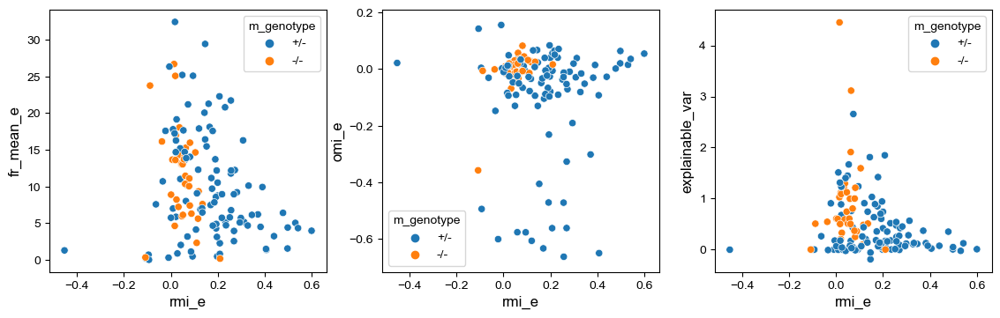

In [32]:
fig, axs = plt.subplots(1,3, figsize=cm2inch((35,10)), dpi=100)
sns.scatterplot(data=hmovu_df, x='rmi_e', y='fr_mean_e', hue='m_genotype', ax=axs[0])
sns.scatterplot(data=hmovu_df, x='rmi_e', y='omi_e', hue='m_genotype', ax=axs[1])
sns.scatterplot(data=hmovu_df, x='rmi_e', y='explainable_var', hue='m_genotype', ax=axs[2])

# SplineLNP() model parameters
- parameters against one another

In [6]:
# df = pd.DataFrame((SplineLNP.Eval() * HmovUnit()).fetch(as_dict=True))
slnp_df = pd.DataFrame((SplineLNP.Eval()).fetch(as_dict=True))
slnp_df.columns = slnp_df.columns.str.replace(r'spl_', '')  # rmv prefixes from column names (better than lstrip)
slnp_df.columns = slnp_df.columns.str.replace(r'hmu_', '')
slnp_df.columns = slnp_df.columns.str.replace(r'hm_', '')

# Add genotype info
genotype = pd.DataFrame(Mouse().fetch(dj.key, 'm_genotype', as_dict=True))
slnp_df = slnp_df.merge(genotype, on='m', how='left')
# slnp_df = slnp_dfslnp_df[slnp_df.m_genotype=='+/-']  # optionally restrict to Ntsr1-Cre pos mice

# Add region info
region = pd.DataFrame(Series().fetch(dj.key, 's_region', as_dict=True))
slnp_df = slnp_df.merge(region, on=['m', 's'], how='left')
slnp_df = slnp_df[slnp_df.s_region=='LGN']  # optionally restrict to LGN

slnp_df

,m,s,e,u,paramset,r_train,r_test_mean,r_test_repeats,r2_train,r2_test_mean,r2_test_repeats,fev,rf_qi,rf_thresh,rf_area,rf_pos_pix,rf_val,m_genotype,s_region
0,Ntsr1Cre_2019_0007,6,9,1,400,0.906642,0.901562,"[0.9538660605644387, 0.8853324608711529, 0.938...",0.512072,0.485495,"[0.5979431289833244, 0.41854646136843865, 0.57...",15.223100,7.608190e-10,-0.131437,0.25,"[12, 11]",-0.131437,+/-,LGN
1,Ntsr1Cre_2019_0007,6,9,1,404,0.906163,0.900925,"[0.9537487657858333, 0.8857606853467798, 0.938...",0.512361,0.485808,"[0.6000221628281932, 0.41772637393085765, 0.57...",15.252400,8.173480e-10,-0.122347,0.25,"[12, 11]",-0.122347,+/-,LGN
2,Ntsr1Cre_2019_0007,6,9,1,405,0.905515,0.903127,"[0.9530675150810783, 0.8859784249560899, 0.938...",0.514078,0.489101,"[0.6037884296879077, 0.4241823888857933, 0.575...",15.324400,7.932870e-10,-0.126058,0.25,"[15, 9]",-0.126058,+/-,LGN
3,Ntsr1Cre_2019_0007,6,9,1,406,0.905454,0.901598,"[0.9547974511602011, 0.887801756985144, 0.9373...",0.512645,0.487975,"[0.6043211809776379, 0.42073624940712584, 0.57...",15.319400,8.172900e-10,-0.122356,0.25,"[12, 11]",-0.122356,+/-,LGN
4,Ntsr1Cre_2019_0007,6,9,1,407,0.905076,0.903123,"[0.9543543041419826, 0.8874875969318473, 0.937...",0.514062,0.489484,"[0.6060441319365852, 0.4236222263644357, 0.574...",15.354000,8.202060e-10,-0.121921,0.25,"[12, 11]",-0.121921,+/-,LGN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1999,Ntsr1Cre_2020_0002,6,6,42,411,0.064476,-0.011301,"[-0.018714204752267167, -0.028345676601697654,...",0.003635,-0.002586,"[-0.0038521753996720864, -0.003338036457170901...",-0.192835,9.314520e-02,0.130000,0.25,"[24, 3]",0.143353,+/-,LGN
2000,Ntsr1Cre_2020_0002,6,6,42,412,0.027076,-0.097702,"[-0.12477613155951978, -0.04967912884963171, -...",-0.012085,-0.053437,"[-0.07083835477649925, -0.032493286367147434, ...",-3.317570,3.911220e-01,0.130000,1.50,"[24, 3]",0.213507,+/-,LGN
2001,Ntsr1Cre_2020_0002,6,6,42,413,0.071872,-0.032356,"[-0.009464981708388054, -0.014536491865708337,...",0.004407,-0.005510,"[-0.003668543241948763, -0.0034046523417006203...",-0.313997,1.424210e-01,0.150000,0.50,"[24, 3]",0.174911,+/-,LGN
2002,Ntsr1Cre_2020_0002,6,6,42,414,0.026621,-0.096381,"[-0.12083095919011812, -0.05305835340108745, -...",-0.012304,-0.053366,"[-0.07122830556634052, -0.032881200090981944, ...",-3.332790,3.810240e-01,0.130000,1.50,"[24, 3]",0.210024,+/-,LGN


In [34]:
slnp_df.columns

Index(['m', 's', 'e', 'u', 'paramset', 'r_train', 'r_test_mean', 'r_test_repeats', 'r2_train', 'r2_test_mean', 'r2_test_repeats', 'fev', 'rf_qi', 'rf_thresh', 'rf_area', 'rf_pos_pix', 'rf_val',
       'm_genotype', 's_region'],
      dtype='object')

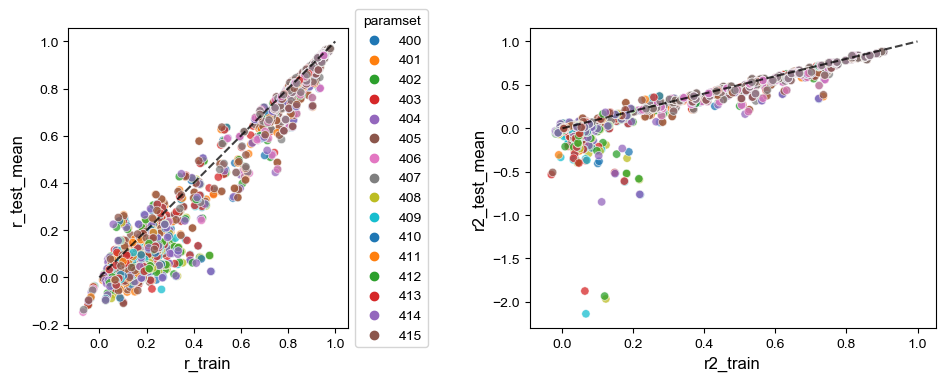

In [35]:
# Plot scatter plots
fig, axs = plt.subplots(1,2, figsize=cm2inch((25,10)), dpi=100)

i = 0
s = sns.scatterplot(data=slnp_df, x='r_train', y='r_test_mean', hue='paramset', palette='tab10', alpha=0.75, ax=axs[i])
s.legend(loc='center left', bbox_to_anchor=(1., 0.5), title='paramset')#, ncol=1)
axs[i].plot([0, 1], [0, 1], color='k', alpha=0.75, linestyle='--')
axs[i].set_aspect('equal')

i=1
s = sns.scatterplot(data=slnp_df, x='r2_train', y='r2_test_mean', hue='paramset', palette='tab10', alpha=0.75, legend=False, ax=axs[i])
axs[i].plot([0, 1], [0, 1], color='k', alpha=0.75, linestyle='--')

fig.tight_layout()

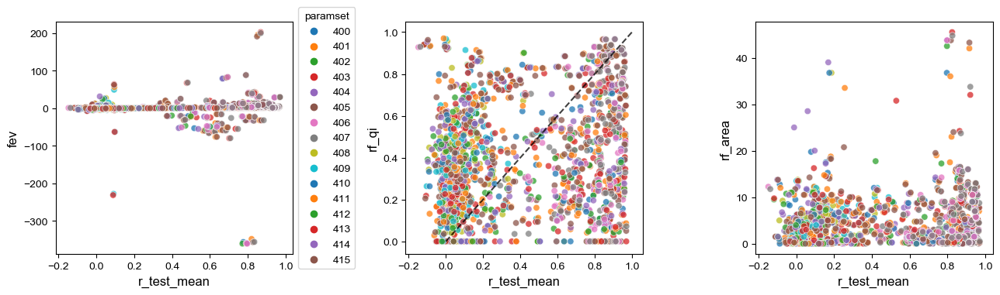

In [36]:
# Plot scatter plots
fig, axs = plt.subplots(1,3, figsize=cm2inch((33,10)), dpi=100)

s = sns.scatterplot(data=slnp_df, x='r_test_mean', y='fev', hue='paramset', palette='tab10', alpha=0.75, ax=axs[0])
s.legend(loc='center left', bbox_to_anchor=(1., 0.5), title='paramset')
s = sns.scatterplot(data=slnp_df, x='r_test_mean', y='rf_qi', hue='paramset', palette='tab10', alpha=0.75, legend=False, ax=axs[1])
axs[1].plot([0, 1], [0, 1], color='k', alpha=0.75, linestyle='--')
s = sns.scatterplot(data=slnp_df, x='r_test_mean', y='rf_area', hue='paramset', palette='tab10', alpha=0.75, legend=False, ax=axs[2])
fig.tight_layout()

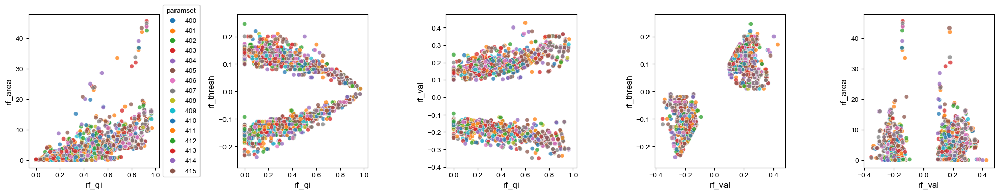

In [37]:
# Plot scatter plots
fig, axs = plt.subplots(1,5, figsize=cm2inch((50,10)), dpi=100)

s = sns.scatterplot(data=slnp_df, x='rf_qi', y='rf_area', hue='paramset', palette='tab10', alpha=0.75, ax=axs[0])
s.legend(loc='center left', bbox_to_anchor=(1., 0.5), title='paramset')
s = sns.scatterplot(data=slnp_df, x='rf_qi', y='rf_thresh', hue='paramset', palette='tab10', alpha=0.75, legend=False, ax=axs[1])
s = sns.scatterplot(data=slnp_df, x='rf_qi', y='rf_val', hue='paramset', palette='tab10', alpha=0.75, legend=False, ax=axs[2])
s = sns.scatterplot(data=slnp_df, x='rf_val', y='rf_thresh', hue='paramset', palette='tab10', alpha=0.75, legend=False, ax=axs[3])
s = sns.scatterplot(data=slnp_df, x='rf_val', y='rf_area', hue='paramset', palette='tab10', alpha=0.75, legend=False, ax=axs[4])

fig.tight_layout()

In [42]:
hmov_df.columns

Index(['m', 's', 'e', 'u', 'paramset', 'r_train', 'r_test_mean', 'r_test_repeats', 'r2_train', 'r2_test_mean', 'r2_test_repeats', 'fev', 'rf_qi', 'rf_thresh', 'rf_area', 'rf_pos_pix', 'rf_val'], dtype='object')

## Optionally get best SLNP model per unit and re-check parameters

In [7]:
# Toggle whether or not to reduce models to only best model 
only_best_model = True

if only_best_model:
    slnp_df = get_best_model(slnp_df, model_type='SplineLNP', crit='spl_r_test_mean', groupby=['m','s','u'],
                        opto_config='_', run_config='_', eye_config='_', pshf_config='_',
                        keys_only=False, format='df', verbose=False)
    slnp_df.columns = slnp_df.columns.str.replace(r'spl_', '')  # rmv prefixes from column names (better than lstrip)
    slnp_df.columns = slnp_df.columns.str.replace(r'hmu_', '')
    slnp_df.columns = slnp_df.columns.str.replace(r'hm_', '')
slnp_df

,m,s,e,u,paramset,r_train,r_test_mean,r_test_repeats,r2_train,r2_test_mean,r2_test_repeats,fev,rf_qi,rf_thresh,rf_area,rf_pos_pix,rf_val
2,Ntsr1Cre_2019_0007,6,9,1,405,0.905515,0.903127,"[0.9530675150810783, 0.8859784249560899, 0.938...",0.514078,0.489101,"[0.6037884296879077, 0.4241823888857933, 0.575...",15.32440,7.932870e-10,-0.126058,0.25,"[15, 9]",-0.126058
16,Ntsr1Cre_2019_0007,6,9,2,403,0.837915,0.832918,"[0.8026122667537137, 0.8317613860976727, 0.801...",0.371874,0.316534,"[0.299173767845308, 0.3060745215474764, 0.3121...",-32.84350,3.977540e-01,0.170000,0.00,"[24, 0]",0.282277
29,Ntsr1Cre_2019_0007,6,9,3,401,0.835300,0.839863,"[0.8568804654974927, 0.8142962567602258, 0.818...",0.286450,0.271841,"[0.3287961149180957, 0.24303987373985148, 0.26...",42.42550,5.875150e-10,0.170208,0.25,"[3, 9]",0.170208
50,Ntsr1Cre_2019_0007,6,9,4,407,0.665628,0.594395,"[0.708116558611915, 0.6758518692999057, 0.7474...",0.179352,0.144777,"[0.1917535862340376, 0.1588869562820252, 0.226...",-66.06200,4.533930e-10,-0.220559,0.00,"[0, 15]",-0.220559
65,Ntsr1Cre_2019_0007,6,9,5,407,0.486689,0.369110,"[0.48848283169750895, 0.31644393933204984, 0.4...",0.112850,0.072868,"[0.0985068422753258, 0.05082130546586827, 0.10...",4.48555,3.565220e-02,-0.230000,0.00,"[0, 3]",-0.238503
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1804,Ntsr1Cre_2020_0002,6,6,28,400,0.926827,0.932108,"[0.9249272969473591, 0.9315514141316044, 0.941...",0.818446,0.839230,"[0.8181756566176182, 0.832796259461414, 0.8534...",1.56667,6.137930e-01,-0.070000,10.50,"[10, 13]",-0.181250
1823,Ntsr1Cre_2020_0002,6,6,30,403,0.783256,0.777272,"[0.7530076407756964, 0.7951074139689939, 0.776...",0.368951,0.366670,"[0.3412469971946176, 0.3901968025433996, 0.368...",13.15270,9.587240e-02,0.150000,0.25,"[18, 3]",0.165906
1839,Ntsr1Cre_2020_0002,6,6,33,403,0.886281,0.863912,"[0.8749309700669445, 0.8616568679096424, 0.840...",0.432745,0.437336,"[0.43533028124019724, 0.4287735397562221, 0.41...",31.01410,1.497030e-01,0.160000,1.00,"[15, 6]",0.188170
1855,Ntsr1Cre_2020_0002,6,6,38,403,0.847809,0.835084,"[0.8430090111559431, 0.8338456630638642, 0.827...",0.437135,0.432308,"[0.4602984520840556, 0.41176058339822375, 0.42...",40.27030,6.847520e-10,0.146038,0.25,"[20, 12]",0.146038


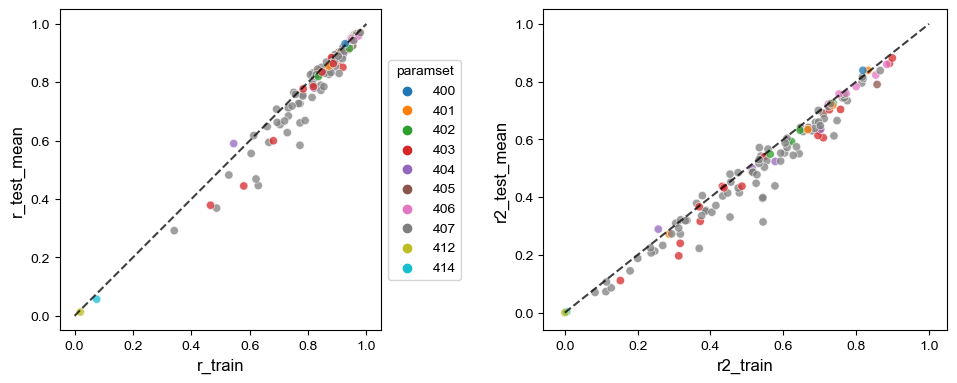

In [8]:
# Plot scatter plots
fig, axs = plt.subplots(1,2, figsize=cm2inch((25,10)), dpi=100)

i = 0
s = sns.scatterplot(data=slnp_df, x='r_train', y='r_test_mean', hue='paramset', palette='tab10', alpha=0.75, ax=axs[i])
s.legend(loc='center left', bbox_to_anchor=(1., 0.5), title='paramset')#, ncol=1)
axs[i].plot([0, 1], [0, 1], color='k', alpha=0.75, linestyle='--')
axs[i].set_aspect('equal')

i=1
s = sns.scatterplot(data=slnp_df, x='r2_train', y='r2_test_mean', hue='paramset', palette='tab10', alpha=0.75, legend=False, ax=axs[i])
axs[i].plot([0, 1], [0, 1], color='k', alpha=0.75, linestyle='--')

fig.tight_layout()

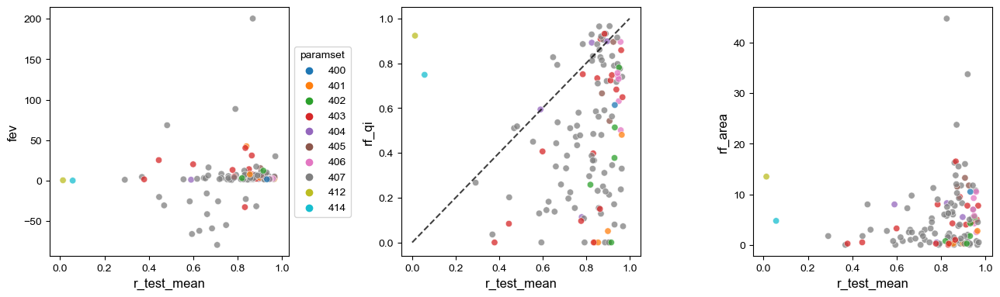

In [41]:
# Plot scatter plots
fig, axs = plt.subplots(1,3, figsize=cm2inch((33,10)), dpi=100)

s = sns.scatterplot(data=slnp_df, x='r_test_mean', y='fev', hue='paramset', palette='tab10', alpha=0.75, ax=axs[0])
s.legend(loc='center left', bbox_to_anchor=(1., 0.5), title='paramset')
s = sns.scatterplot(data=slnp_df, x='r_test_mean', y='rf_qi', hue='paramset', palette='tab10', alpha=0.75, legend=False, ax=axs[1])
axs[1].plot([0, 1], [0, 1], color='k', alpha=0.75, linestyle='--')
s = sns.scatterplot(data=slnp_df, x='r_test_mean', y='rf_area', hue='paramset', palette='tab10', alpha=0.75, legend=False, ax=axs[2])
fig.tight_layout()

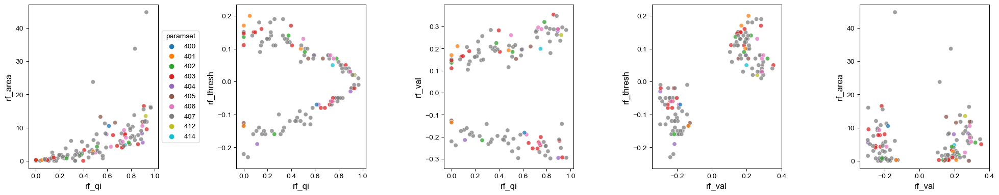

In [42]:
# Plot scatter plots
fig, axs = plt.subplots(1,5, figsize=cm2inch((50,10)), dpi=100)

s = sns.scatterplot(data=slnp_df, x='rf_qi', y='rf_area', hue='paramset', palette='tab10', alpha=0.75, ax=axs[0])
s.legend(loc='center left', bbox_to_anchor=(1., 0.5), title='paramset')
s = sns.scatterplot(data=slnp_df, x='rf_qi', y='rf_thresh', hue='paramset', palette='tab10', alpha=0.75, legend=False, ax=axs[1])
s = sns.scatterplot(data=slnp_df, x='rf_qi', y='rf_val', hue='paramset', palette='tab10', alpha=0.75, legend=False, ax=axs[2])
s = sns.scatterplot(data=slnp_df, x='rf_val', y='rf_thresh', hue='paramset', palette='tab10', alpha=0.75, legend=False, ax=axs[3])
s = sns.scatterplot(data=slnp_df, x='rf_val', y='rf_area', hue='paramset', palette='tab10', alpha=0.75, legend=False, ax=axs[4])

fig.tight_layout()

# SplineLNP() model parameters against unit info df

## Prepare data

### Get unit-experiment info df (mseu) and reduce to unit-wise info (msu)
This unit-experiment info df was previously computed based on unit respones to other stimuli (e.g. chirp, oriTun, conTun) to obtain unit typing into ON/OFF/trans/sust, OSI/DSI, and SbC.
This unit-exp info is reduced to unit-wise info by removing potential duplicate experiments for units (and taking the best experiment only), and applying certain unit selection criteria (defaults and/or manual)

In [9]:
# Get unit-exp info df
unitexp_info_df = l6s_utils.get_all_unitexp_info(load_df_name='unitexp_info_20210521')
unitexp_info_df

get_all_unitexp_info(): Getting combined unit experiment info.
  Loading saved unit info file: /Users/ybauer/GDrive/BBE_BusseBerensEuler/projects/ct-fb_L6_suppression/analyses/L6_suppression/l6s/unit_crit_and_type_info/data/unitexp_info_20210521.csv


,m,s,e,u,m_genotype,s_region,e_name,osi_ctrl,osi_opto,dsi_ctrl,...,fr_sem_stim_opto,fr_mean_spon_ctrl,fr_sem_spon_ctrl,fr_mean_spon_opto,fr_sem_spon_opto,omi_e,omi_stim,omi_spon,snr_opto,snr_ctrl
0,Ntsr1Cre_2019_0002,3,1,13,+/-,LGN,AsparseNoise5_60deg,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Ntsr1Cre_2019_0002,3,1,14,+/-,LGN,AsparseNoise5_60deg,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Ntsr1Cre_2019_0002,3,1,19,+/-,LGN,AsparseNoise5_60deg,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Ntsr1Cre_2019_0002,3,1,30,+/-,LGN,AsparseNoise5_60deg,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Ntsr1Cre_2019_0002,3,1,40,+/-,LGN,AsparseNoise5_60deg,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2676,Ntsr1Cre_2020_0003,2,17,140,+/-,V1,MAS_1400_200-500_ChR2,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2677,Ntsr1Cre_2020_0003,2,17,141,+/-,V1,MAS_1400_200-500_ChR2,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2678,Ntsr1Cre_2020_0003,2,17,142,+/-,V1,MAS_1400_200-500_ChR2,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2679,Ntsr1Cre_2020_0003,2,17,144,+/-,V1,MAS_1400_200-500_ChR2,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [10]:
unitexp_info_df.keys()

Index(['m', 's', 'e', 'u', 'm_genotype', 's_region', 'e_name', 'osi_ctrl', 'osi_opto', 'dsi_ctrl', 'dsi_opto', 'sbc_zscore', 'sbc', 'sbc_method', 'chirp_type', 'wave_type', 'burst_ratio_ctrl',
       'burst_ratio_opto', 'tun_model', 'tun_rsq_ctrl', 'tun_rsq_opto', 'c_zscore', 'fr_mean_e', 'fr_sem_e', 'fr_mean_stim', 'fr_sem_stim', 'fr_mean_spon', 'fr_sem_spon', 'fr_mean_ctrl',
       'fr_sem_ctrl', 'fr_mean_opto', 'fr_sem_opto', 'fr_mean_stim_ctrl', 'fr_sem_stim_ctrl', 'fr_mean_stim_opto', 'fr_sem_stim_opto', 'fr_mean_spon_ctrl', 'fr_sem_spon_ctrl', 'fr_mean_spon_opto',
       'fr_sem_spon_opto', 'omi_e', 'omi_stim', 'omi_spon', 'snr_opto', 'snr_ctrl'],
      dtype='object')

In [11]:
# Reduce unitexp info to unit-wise info
unit_info_df = l6s_utils.reduce_unitexp2unit_info(unitexp_info_df, sbc_class_stim='oriTun',
                                                  apply_crit=True, default_crit=True, 
                                                  manual_crit={'all': {'s_region': 'LGN',
#                                                                'm_genotype': '+/-',
                                                               }})
unit_info_df

reduce_unitexp2unit_info(): Reducing unit-experiment df (n rows = 2681) to unit df.
  Using oriTun for SbC classification.
apply_unitexp_crit(): Applying unit selection criteria.
  defaults: True; manuals: {'all': {'s_region': 'LGN'}}
set_unitexp_crit(): Setting criteria:
   {'all': {'fr_mean_e': 0.5, 's_region': 'LGN'}, 'oriTun': {'tun_rsq_ctrl': 0.25, 'fr_mean_e': 0.5}}
apply_unitexp_crit():
  256/2681 (9.55 %) unit exps did not pass criterion 0.5 applied to group: fr_mean_e.
  779/2681 (29.06 %) unit exps did not pass criterion LGN applied to group: s_region.
  1035/2681 (38.6 %) unit exps did not pass criterion {'fr_mean_e': 0.5, 's_region': 'LGN'} applied to group: all.
  77/2681 (2.87 %) unit exps did not pass criterion {'tun_rsq_ctrl': 0.25, 'fr_mean_e': 0.5} applied to group: oriTun.
  Removing total of 936 unique unit experiments from input df of length 2681 (34.91 %). 1745 (65.09 %) remaining.
rmv_dupl_unitexps(): Criteria for duplicate unit experiment removal:
  {'oriTun12':

,m,s,u,m_genotype,s_region,chirp_type,osi_ctrl,osi_opto,dsi_ctrl,dsi_opto,sbc_zscore,sbc,wave_type
0,Ntsr1Cre_2019_0002,3,13,+/-,LGN,ON-sust.,0.058347,0.015818,0.003239,0.081268,3.288161,False,excit
1,Ntsr1Cre_2019_0002,3,14,+/-,LGN,ON-OFF-trans.,0.019194,0.067131,0.093939,0.070952,4.316509,False,excit
2,Ntsr1Cre_2019_0002,3,19,+/-,LGN,mixed,0.132265,0.150986,0.242817,0.033709,4.236185,False,excit
3,Ntsr1Cre_2019_0002,3,30,+/-,LGN,ON-OFF-trans.,0.122563,0.020055,0.086487,0.127151,5.810582,False,excit
4,Ntsr1Cre_2019_0002,3,40,+/-,LGN,ON-OFF-trans.,NaN,NaN,NaN,NaN,2.780215,False,excit
...,...,...,...,...,...,...,...,...,...,...,...,...,...
193,Ntsr1Cre_2020_0002,6,28,+/-,LGN,OFF-sust.,0.056904,0.016069,0.336862,0.102671,0.685934,False,excit
194,Ntsr1Cre_2020_0002,6,33,+/-,LGN,NaN,0.050882,0.061101,0.038114,0.001934,2.877018,False,excit
195,Ntsr1Cre_2020_0002,6,38,+/-,LGN,NaN,0.035581,0.079042,0.114845,0.040818,0.208226,False,excit
196,Ntsr1Cre_2020_0002,6,42,+/-,LGN,NaN,0.058159,0.055284,0.106481,0.035697,1.335863,False,excit


In [11]:
unit_info_df.keys()

Index(['m', 's', 'u', 'm_genotype', 's_region', 'chirp_type', 'osi_ctrl', 'osi_opto', 'dsi_ctrl', 'dsi_opto', 'sbc_zscore', 'sbc', 'wave_type'], dtype='object')

### Merge unit info with HmovUnit() df and SplineLNP() df to creat single unit df

In [13]:
hmovu_df

,m,s,e,u,version,seq_num,fr_mean_e,fr_var_e,fr_mean_stim,fr_mean_stim_ctrl,...,omi_e,omi_stim,omi_spont,rmi_e,oracle,explainable_var,sta_corrected,ts,m_genotype,s_region
0,Ntsr1Cre_2019_0007,6,9,1,3,1,3.187930,0.099487,3.175080,3.134990,...,0.017330,0.016479,0.023492,0.070960,0.079670,0.048276,"[[0.0023613724447980877, 0.0030373545108378502...",2021-06-02 18:44:47,+/-,LGN
1,Ntsr1Cre_2019_0007,6,9,2,3,1,0.314107,0.005292,0.326602,0.270756,...,0.155874,0.137091,0.303167,-0.009540,-0.029886,-0.000538,"[[0.0022682736316046795, 0.0018539165972493027...",2021-06-02 18:45:08,+/-,LGN
2,Ntsr1Cre_2019_0007,6,9,3,3,1,0.715252,0.015358,0.723626,0.717029,...,0.004612,-0.002465,0.302003,-0.095041,0.021725,0.001476,"[[-0.0008413160603633341, -0.00092340739772293...",2021-06-02 18:45:28,+/-,LGN
3,Ntsr1Cre_2019_0007,6,9,4,3,1,0.219647,0.003611,0.225128,0.192709,...,0.142684,0.121808,0.287607,-0.106221,-0.010738,-0.000069,"[[-0.0006752949672300182, -0.00017738839294400...",2021-06-02 18:45:49,+/-,LGN
4,Ntsr1Cre_2019_0007,6,9,5,3,1,0.484936,0.007475,0.485190,0.502309,...,-0.026113,-0.035539,0.136408,0.197597,0.055330,0.001286,"[[0.0011552864206164151, 0.0017550234715710544...",2021-06-02 18:46:09,+/-,LGN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
154,Ntsr1Cre_2020_0002,6,6,28,3,9,21.182600,0.390978,21.326800,20.349600,...,0.033922,0.039031,-0.027584,0.073500,0.723163,2.655950,"[[-0.0001962279323555402, -0.00045729835148366...",2021-06-02 20:45:52,+/-,LGN
155,Ntsr1Cre_2020_0002,6,6,30,3,9,14.707800,0.186528,14.671100,15.117300,...,-0.024081,-0.027620,0.033038,0.059101,0.081442,0.075420,"[[-0.0002837470271844153, -0.00026337279744968...",2021-06-02 20:46:15,+/-,LGN
156,Ntsr1Cre_2020_0002,6,6,33,3,9,19.150300,0.299813,19.371000,19.642300,...,-0.025478,-0.025492,-0.019475,0.024734,0.044743,0.040886,"[[-9.081468692775929e-05, 1.0027847660187827e-...",2021-06-02 20:46:39,+/-,LGN
157,Ntsr1Cre_2020_0002,6,6,38,3,9,13.873600,0.203965,14.008400,14.568300,...,-0.050377,-0.049661,-0.056418,0.065776,0.034250,0.028230,"[[-0.0005702388788273241, -0.00044365661772834...",2021-06-02 20:46:58,+/-,LGN


In [15]:
hmovu_df.keys()

Index(['m', 's', 'e', 'u', 'version', 'seq_num', 'fr_mean_e', 'fr_var_e', 'fr_mean_stim', 'fr_mean_stim_ctrl', 'fr_var_stim_ctrl', 'fr_mean_stim_opto', 'fr_var_stim_opto', 'fr_mean_spont_ctrl',
       'fr_var_spont_ctrl', 'fr_mean_spont_opto', 'fr_var_spont_opto', 'omi_e', 'omi_stim', 'omi_spont', 'rmi_e', 'oracle', 'explainable_var', 'sta_corrected', 'ts', 'm_genotype', 's_region'],
      dtype='object')

In [44]:
slnp_df

,m,s,e,u,paramset,r_train,r_test_mean,r_test_repeats,r2_train,r2_test_mean,r2_test_repeats,fev,rf_qi,rf_thresh,rf_area,rf_pos_pix,rf_val
2,Ntsr1Cre_2019_0007,6,9,1,405,0.905515,0.903127,"[0.9530675150810783, 0.8859784249560899, 0.938...",0.514078,0.489101,"[0.6037884296879077, 0.4241823888857933, 0.575...",15.32440,7.932870e-10,-0.126058,0.25,"[15, 9]",-0.126058
16,Ntsr1Cre_2019_0007,6,9,2,403,0.837915,0.832918,"[0.8026122667537137, 0.8317613860976727, 0.801...",0.371874,0.316534,"[0.299173767845308, 0.3060745215474764, 0.3121...",-32.84350,3.977540e-01,0.170000,0.00,"[24, 0]",0.282277
29,Ntsr1Cre_2019_0007,6,9,3,401,0.835300,0.839863,"[0.8568804654974927, 0.8142962567602258, 0.818...",0.286450,0.271841,"[0.3287961149180957, 0.24303987373985148, 0.26...",42.42550,5.875150e-10,0.170208,0.25,"[3, 9]",0.170208
50,Ntsr1Cre_2019_0007,6,9,4,407,0.665628,0.594395,"[0.708116558611915, 0.6758518692999057, 0.7474...",0.179352,0.144777,"[0.1917535862340376, 0.1588869562820252, 0.226...",-66.06200,4.533930e-10,-0.220559,0.00,"[0, 15]",-0.220559
65,Ntsr1Cre_2019_0007,6,9,5,407,0.486689,0.369110,"[0.48848283169750895, 0.31644393933204984, 0.4...",0.112850,0.072868,"[0.0985068422753258, 0.05082130546586827, 0.10...",4.48555,3.565220e-02,-0.230000,0.00,"[0, 3]",-0.238503
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1804,Ntsr1Cre_2020_0002,6,6,28,400,0.926827,0.932108,"[0.9249272969473591, 0.9315514141316044, 0.941...",0.818446,0.839230,"[0.8181756566176182, 0.832796259461414, 0.8534...",1.56667,6.137930e-01,-0.070000,10.50,"[10, 13]",-0.181250
1823,Ntsr1Cre_2020_0002,6,6,30,403,0.783256,0.777272,"[0.7530076407756964, 0.7951074139689939, 0.776...",0.368951,0.366670,"[0.3412469971946176, 0.3901968025433996, 0.368...",13.15270,9.587240e-02,0.150000,0.25,"[18, 3]",0.165906
1839,Ntsr1Cre_2020_0002,6,6,33,403,0.886281,0.863912,"[0.8749309700669445, 0.8616568679096424, 0.840...",0.432745,0.437336,"[0.43533028124019724, 0.4287735397562221, 0.41...",31.01410,1.497030e-01,0.160000,1.00,"[15, 6]",0.188170
1855,Ntsr1Cre_2020_0002,6,6,38,403,0.847809,0.835084,"[0.8430090111559431, 0.8338456630638642, 0.827...",0.437135,0.432308,"[0.4602984520840556, 0.41176058339822375, 0.42...",40.27030,6.847520e-10,0.146038,0.25,"[20, 12]",0.146038


In [45]:
slnp_df.keys()

Index(['m', 's', 'e', 'u', 'paramset', 'r_train', 'r_test_mean', 'r_test_repeats', 'r2_train', 'r2_test_mean', 'r2_test_repeats', 'fev', 'rf_qi', 'rf_thresh', 'rf_area', 'rf_pos_pix', 'rf_val'], dtype='object')

In [12]:
unit_info_df.drop(['m_genotype', 's_region'], axis=1, inplace=True)  # already in hmovu_df 
unit_info_df

,m,s,u,chirp_type,osi_ctrl,osi_opto,dsi_ctrl,dsi_opto,sbc_zscore,sbc,wave_type
0,Ntsr1Cre_2019_0002,3,13,ON-sust.,0.058347,0.015818,0.003239,0.081268,3.288161,False,excit
1,Ntsr1Cre_2019_0002,3,14,ON-OFF-trans.,0.019194,0.067131,0.093939,0.070952,4.316509,False,excit
2,Ntsr1Cre_2019_0002,3,19,mixed,0.132265,0.150986,0.242817,0.033709,4.236185,False,excit
3,Ntsr1Cre_2019_0002,3,30,ON-OFF-trans.,0.122563,0.020055,0.086487,0.127151,5.810582,False,excit
4,Ntsr1Cre_2019_0002,3,40,ON-OFF-trans.,NaN,NaN,NaN,NaN,2.780215,False,excit
...,...,...,...,...,...,...,...,...,...,...,...
193,Ntsr1Cre_2020_0002,6,28,OFF-sust.,0.056904,0.016069,0.336862,0.102671,0.685934,False,excit
194,Ntsr1Cre_2020_0002,6,33,NaN,0.050882,0.061101,0.038114,0.001934,2.877018,False,excit
195,Ntsr1Cre_2020_0002,6,38,NaN,0.035581,0.079042,0.114845,0.040818,0.208226,False,excit
196,Ntsr1Cre_2020_0002,6,42,NaN,0.058159,0.055284,0.106481,0.035697,1.335863,False,excit


In [28]:
# Check which unit entries are missing in respective dfs. Reasons include:
# - in unit_info_df but not in hmovu_df: early units do not have hmov recordings
# - in slnp_df but not in hmovu_df: slnp_df might contain V1 units unless excluded
# - in hmovu_df but not in slnp_df: units could not be fitted
df1 = unit_info_df.merge(hmovu_df, how='outer', indicator=True)#.loc[lambda x : x['_merge']=='left_only']
df2 = slnp_df.merge(hmovu_df, how='outer', indicator=True)#.loc[lambda x : x['_merge']=='left_only']
df1[0:50]

,m,s,u,chirp_type,osi_ctrl,osi_opto,dsi_ctrl,dsi_opto,sbc_zscore,sbc,...,omi_stim,omi_spont,rmi_e,oracle,explainable_var,sta_corrected,ts,m_genotype,s_region,_merge
200,Ntsr1Cre_2020_0002,5,87,NaN,0.052558,0.010500,0.000942,0.067820,-0.025145,False,...,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,left_only
201,Ntsr1Cre_2020_0002,5,29,OFF-sust.,0.127069,0.133440,0.375637,0.209670,1.034193,False,...,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,left_only
202,Ntsr1Cre_2020_0002,6,5,mixed,0.111333,0.074322,0.297026,0.279939,-2.060808,False,...,-0.054654,0.047603,0.040098,0.556348,1.401260,"[[-0.0010842276869936565, -0.00094650778760049...",2021-06-02 20:42:30,+/-,LGN,both
203,Ntsr1Cre_2020_0002,6,9,OFF-sust.,0.346718,0.252478,0.162279,0.134975,0.244991,False,...,-0.082357,-0.436248,0.134519,0.520359,0.741945,"[[0.0036072928260113615, 0.005369129250921888,...",2021-06-02 20:42:49,+/-,LGN,both
204,Ntsr1Cre_2020_0002,6,11,mixed,0.139762,0.188440,0.720024,0.756000,-1.793470,False,...,0.004483,-0.000813,0.009516,0.526673,1.510610,"[[-0.0013536989449619771, -0.00175407398524869...",2021-06-02 20:43:09,+/-,LGN,both
205,Ntsr1Cre_2020_0002,6,15,mixed,0.060375,0.080115,0.022913,0.058834,-0.827646,False,...,0.009738,0.013326,0.022010,0.539186,1.231810,"[[-0.0029553538037993474, -0.00284799484466700...",2021-06-02 20:43:29,+/-,LGN,both
206,Ntsr1Cre_2020_0002,6,17,mixed,0.163820,0.115118,0.043504,0.051696,-2.563091,True,...,-0.078182,-0.177553,0.016324,0.542637,1.311470,"[[-0.0005076037971629491, -0.00066434697854032...",2021-06-02 20:43:48,+/-,LGN,both
207,Ntsr1Cre_2020_0002,6,18,ON-OFF-trans.,0.082011,0.088137,0.172538,0.089501,1.329635,False,...,-0.081125,-0.371927,0.021188,0.541940,0.885329,"[[-0.0009437019751325632, -0.00116292050351896...",2021-06-02 20:44:08,+/-,LGN,both
208,Ntsr1Cre_2020_0002,6,23,OFF-sust.,0.027500,0.055030,0.057014,0.063878,-6.386582,True,...,-0.098244,-0.063552,0.053800,0.654739,1.667010,"[[-0.0007497822799832077, -0.00051932919086920...",2021-06-02 20:44:34,+/-,LGN,both
209,Ntsr1Cre_2020_0002,6,26,mixed,0.140007,0.170701,0.387567,0.445416,0.403691,False,...,-0.075988,0.033609,0.111642,0.359821,0.256933,"[[0.0001735068251802474, 0.0001309436188603463...",2021-06-02 20:44:58,+/-,LGN,both


In [13]:
udf = unit_info_df.merge(hmovu_df, on=['m','s','u'])  # default: how='inner'
udf

,m,s,u,chirp_type,osi_ctrl,osi_opto,dsi_ctrl,dsi_opto,sbc_zscore,sbc,...,omi_e,omi_stim,omi_spont,rmi_e,oracle,explainable_var,sta_corrected,ts,m_genotype,s_region
0,Ntsr1Cre_2019_0007,6,1,NaN,0.242542,0.222695,0.648497,0.176604,-1.211025,False,...,0.017330,0.016479,0.023492,0.070960,0.079670,0.048276,"[[0.0023613724447980877, 0.0030373545108378502...",2021-06-02 18:44:47,+/-,LGN
1,Ntsr1Cre_2019_0007,6,3,NaN,0.235136,0.141376,0.304742,0.405608,-1.739985,False,...,0.004612,-0.002465,0.302003,-0.095041,0.021725,0.001476,"[[-0.0008413160603633341, -0.00092340739772293...",2021-06-02 18:45:28,+/-,LGN
2,Ntsr1Cre_2019_0007,6,4,NaN,0.128072,0.398797,0.033968,0.409643,NaN,NaN,...,0.142684,0.121808,0.287607,-0.106221,-0.010738,-0.000069,"[[-0.0006752949672300182, -0.00017738839294400...",2021-06-02 18:45:49,+/-,LGN
3,Ntsr1Cre_2019_0007,6,7,OFF-sust.,0.170548,0.163939,0.240574,0.273867,-5.231121,True,...,-0.090503,-0.099344,0.004608,0.233067,0.358214,0.177800,"[[0.0010929329416216743, 0.0011176193860416156...",2021-06-02 18:46:34,+/-,LGN
4,Ntsr1Cre_2019_0007,6,8,mixed,0.034076,0.044401,0.039928,0.136595,3.809160,False,...,-0.079358,-0.066708,-0.271857,0.199746,0.536551,0.740087,"[[-0.0026647853469035157, -0.00258295503447851...",2021-06-02 18:46:55,+/-,LGN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
137,Ntsr1Cre_2020_0002,6,28,OFF-sust.,0.056904,0.016069,0.336862,0.102671,0.685934,False,...,0.033922,0.039031,-0.027584,0.073500,0.723163,2.655950,"[[-0.0001962279323555402, -0.00045729835148366...",2021-06-02 20:45:52,+/-,LGN
138,Ntsr1Cre_2020_0002,6,33,NaN,0.050882,0.061101,0.038114,0.001934,2.877018,False,...,-0.025478,-0.025492,-0.019475,0.024734,0.044743,0.040886,"[[-9.081468692775929e-05, 1.0027847660187827e-...",2021-06-02 20:46:39,+/-,LGN
139,Ntsr1Cre_2020_0002,6,38,NaN,0.035581,0.079042,0.114845,0.040818,0.208226,False,...,-0.050377,-0.049661,-0.056418,0.065776,0.034250,0.028230,"[[-0.0005702388788273241, -0.00044365661772834...",2021-06-02 20:46:58,+/-,LGN
140,Ntsr1Cre_2020_0002,6,42,NaN,0.058159,0.055284,0.106481,0.035697,1.335863,False,...,0.012507,0.012861,-0.004279,0.017796,0.049903,0.175135,"[[-0.00020771177034079047, -0.0001710714978467...",2021-06-02 20:47:19,+/-,LGN


In [14]:
udf = udf.merge(slnp_df, on=['m','s','e','u'])
udf

,m,s,u,chirp_type,osi_ctrl,osi_opto,dsi_ctrl,dsi_opto,sbc_zscore,sbc,...,r_test_repeats,r2_train,r2_test_mean,r2_test_repeats,fev,rf_qi,rf_thresh,rf_area,rf_pos_pix,rf_val
0,Ntsr1Cre_2019_0007,6,1,NaN,0.242542,0.222695,0.648497,0.176604,-1.211025,False,...,"[0.9530675150810783, 0.8859784249560899, 0.938...",0.514078,0.489101,"[0.6037884296879077, 0.4241823888857933, 0.575...",15.32440,7.932870e-10,-0.126058,0.25,"[15, 9]",-0.126058
1,Ntsr1Cre_2019_0007,6,3,NaN,0.235136,0.141376,0.304742,0.405608,-1.739985,False,...,"[0.8568804654974927, 0.8142962567602258, 0.818...",0.286450,0.271841,"[0.3287961149180957, 0.24303987373985148, 0.26...",42.42550,5.875150e-10,0.170208,0.25,"[3, 9]",0.170208
2,Ntsr1Cre_2019_0007,6,4,NaN,0.128072,0.398797,0.033968,0.409643,NaN,NaN,...,"[0.708116558611915, 0.6758518692999057, 0.7474...",0.179352,0.144777,"[0.1917535862340376, 0.1588869562820252, 0.226...",-66.06200,4.533930e-10,-0.220559,0.00,"[0, 15]",-0.220559
3,Ntsr1Cre_2019_0007,6,7,OFF-sust.,0.170548,0.163939,0.240574,0.273867,-5.231121,True,...,"[0.788012363088473, 0.8142464619398074, 0.7815...",0.577618,0.523745,"[0.5091778408887211, 0.5733509819500541, 0.503...",3.01890,1.133030e-01,-0.190000,0.50,"[15, 3]",-0.214278
4,Ntsr1Cre_2019_0007,6,8,mixed,0.034076,0.044401,0.039928,0.136595,3.809160,False,...,"[0.9311412536966458, 0.9045253196704028, 0.913...",0.775568,0.734190,"[0.777773954904236, 0.7631627236526632, 0.7596...",2.30337,9.324090e-01,0.020000,11.75,"[15, 6]",0.295899
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
116,Ntsr1Cre_2020_0002,6,28,OFF-sust.,0.056904,0.016069,0.336862,0.102671,0.685934,False,...,"[0.9249272969473591, 0.9315514141316044, 0.941...",0.818446,0.839230,"[0.8181756566176182, 0.832796259461414, 0.8534...",1.56667,6.137930e-01,-0.070000,10.50,"[10, 13]",-0.181250
117,Ntsr1Cre_2020_0002,6,33,NaN,0.050882,0.061101,0.038114,0.001934,2.877018,False,...,"[0.8749309700669445, 0.8616568679096424, 0.840...",0.432745,0.437336,"[0.43533028124019724, 0.4287735397562221, 0.41...",31.01410,1.497030e-01,0.160000,1.00,"[15, 6]",0.188170
118,Ntsr1Cre_2020_0002,6,38,NaN,0.035581,0.079042,0.114845,0.040818,0.208226,False,...,"[0.8430090111559431, 0.8338456630638642, 0.827...",0.437135,0.432308,"[0.4602984520840556, 0.41176058339822375, 0.42...",40.27030,6.847520e-10,0.146038,0.25,"[20, 12]",0.146038
119,Ntsr1Cre_2020_0002,6,42,NaN,0.058159,0.055284,0.106481,0.035697,1.335863,False,...,"[0.9728129827266486, 0.9732736621894971, 0.972...",0.533563,0.530166,"[0.5332343191825017, 0.5287561895459576, 0.540...",30.01700,7.227700e-02,0.140000,0.50,"[20, 12]",0.150907


In [15]:
udf.keys()

Index(['m', 's', 'u', 'chirp_type', 'osi_ctrl', 'osi_opto', 'dsi_ctrl', 'dsi_opto', 'sbc_zscore', 'sbc', 'wave_type', 'e', 'version', 'seq_num', 'fr_mean_e', 'fr_var_e', 'fr_mean_stim',
       'fr_mean_stim_ctrl', 'fr_var_stim_ctrl', 'fr_mean_stim_opto', 'fr_var_stim_opto', 'fr_mean_spont_ctrl', 'fr_var_spont_ctrl', 'fr_mean_spont_opto', 'fr_var_spont_opto', 'omi_e', 'omi_stim',
       'omi_spont', 'rmi_e', 'oracle', 'explainable_var', 'sta_corrected', 'ts', 'm_genotype', 's_region', 'paramset', 'r_train', 'r_test_mean', 'r_test_repeats', 'r2_train', 'r2_test_mean',
       'r2_test_repeats', 'fev', 'rf_qi', 'rf_thresh', 'rf_area', 'rf_pos_pix', 'rf_val'],
      dtype='object')

## Hmov model X OSI/DSI
- prediction quality (r_test_mean): 
  - are OS/DS cells harder to predict?
- RF quality (rf_qi):
  - Do OS/DS cells have lower rf_qi?
- other RF properties e.g. rf_area, rf_val, rf_pos_pix
  - do OS/DS cells differ on any?

Non-model parameters
- oracle: do OS/DS cells have higher-lower oracles scores?
- rmi: are OS/DS cells more run-modulated?
- mean FR: do they have higher/lower FRs?
- omi: are OS/DS cells more/less opto-modulated?
- chirp_type: are OS/DS cells over-/underrepresented in a particular chirp type?

TODO: try using all models (not just best) to boost n

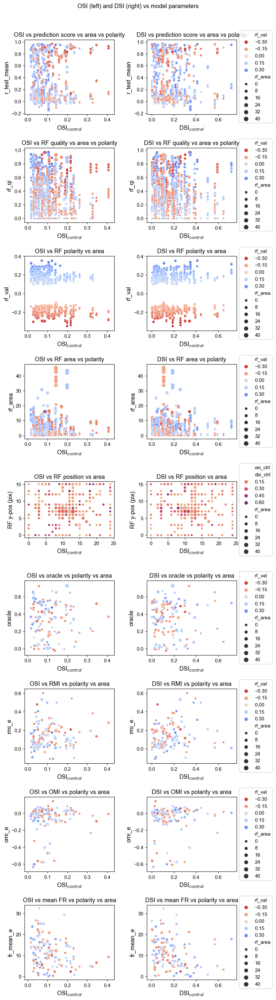

In [18]:
# Plot scatter plot of OSI/DSI (control) vs model prediction vs RF area
fig, axs = plt.subplots(nrows=9, ncols=2, figsize=cm2inch((20,70)), dpi=110)

# OSI/DSI vs r_test_mean
s = sns.scatterplot(data=udf, x='osi_ctrl', y='r_test_mean', size='rf_area', hue='rf_val', palette='coolwarm_r', legend=False, ax=axs[0,0])
axs[0,0].set_title('OSI vs prediction score vs area vs polarity')
# axs[0,0].plot([0, 1], [0, 1], color='grey', linestyle='--', transform=axs[0,0].transAxes, zorder=-1)

s = sns.scatterplot(data=udf, x='dsi_ctrl', y='r_test_mean', size='rf_area', hue='rf_val', palette='coolwarm_r', ax=axs[0,1])
axs[0,1].set_title('DSI vs prediction score vs area vs polarity')
s.legend(loc='center left', bbox_to_anchor=(1., 0.5))#, title='paramset')#, ncol=1)


# OSI/DSI vs RF quality
s = sns.scatterplot(data=udf, x='osi_ctrl', y='rf_qi', size='rf_area', hue='rf_val', palette='coolwarm_r', legend=False, ax=axs[1,0])
axs[1,0].set_title('OSI vs RF quality vs area vs polarity')
# axs[1,0].plot([0, 1], [0, 1], color='grey', linestyle='--', transform=axs[1,0].transAxes, zorder=-1);

s = sns.scatterplot(data=udf, x='dsi_ctrl', y='rf_qi', size='rf_area', hue='rf_val', palette='coolwarm_r', ax=axs[1,1])
axs[1,1].set_title('DSI vs RF quality vs area vs polarity')
s.legend(loc='center left', bbox_to_anchor=(1., 0.5))


# OSI/DSI vs RF val
s = sns.scatterplot(data=udf, x='osi_ctrl', y='rf_val', size='rf_area', hue='rf_val', palette='coolwarm_r', legend=False, ax=axs[2,0])
axs[2,0].set_title('OSI vs RF polarity vs area')

s = sns.scatterplot(data=udf, x='dsi_ctrl', y='rf_val', size='rf_area', hue='rf_val', palette='coolwarm_r', ax=axs[2,1])
axs[2,1].set_title('DSI vs RF polarity vs area')
s.legend(loc='center left', bbox_to_anchor=(1., 0.5))


# OSI/DSI vs RF area
s = sns.scatterplot(data=udf, x='osi_ctrl', y='rf_area', size='rf_area', hue='rf_val', palette='coolwarm_r', legend=False, ax=axs[3,0])
axs[3,0].set_title('OSI vs RF area vs polarity')

s = sns.scatterplot(data=udf, x='dsi_ctrl', y='rf_area', size='rf_area', hue='rf_val', palette='coolwarm_r', ax=axs[3,1])
axs[3,1].set_title('DSI vs RF area vs polarity')
s.legend(loc='center left', bbox_to_anchor=(1., 0.5))


# OSI/DSI vs RF position
x_pos = np.array([x for x,y in udf.rf_pos_pix.values])
y_pos = np.array([y for x,y in udf.rf_pos_pix.values])
s = sns.scatterplot(data=udf, x=x_pos, y=y_pos, size='rf_area', hue='osi_ctrl', palette='flare', legend=False, ax=axs[4,0])  # crest, rocket_r
axs[4,0].set_title('OSI vs RF position vs area')
axs[4,0].set_xlabel('RF x-pos (pix)')
axs[4,0].set_ylabel('RF y-pos (pix)')
axs[4,0].set_aspect('equal')

s = sns.scatterplot(data=udf, x=x_pos, y=y_pos, size='rf_area', hue='dsi_ctrl', palette='flare', ax=axs[4,1])
l = s.legend(loc='center left', bbox_to_anchor=(1., 0.5), title='osi_ctrl')#, ncol=1)
l.get_title().set_position((20, 0))
axs[4,1].set_title('DSI vs RF position vs area')
axs[4,1].set_xlabel('RF x-pos (pix)')
axs[4,1].set_ylabel('RF y-pos (pix)')
axs[4,1].set_aspect('equal')


# OSI/DSI vs oracle
s = sns.scatterplot(data=udf, x='osi_ctrl', y='oracle', size='rf_area', hue='rf_val', palette='coolwarm_r', legend=False, ax=axs[5,0])
axs[5,0].set_title('OSI vs oracle vs polarity vs area')

s = sns.scatterplot(data=udf, x='dsi_ctrl', y='oracle', size='rf_area', hue='rf_val', palette='coolwarm_r', legend=True, ax=axs[5,1])
l = s.legend(loc='center left', bbox_to_anchor=(1., 0.5))
axs[5,1].set_title('DSI vs oracle vs polarity vs area')


# OSI/DSI vs RMI
s = sns.scatterplot(data=udf, x='osi_ctrl', y='rmi_e', size='rf_area', hue='rf_val', palette='coolwarm_r', legend=False, ax=axs[6,0])
axs[6,0].set_title('OSI vs RMI vs polarity vs area')

s = sns.scatterplot(data=udf, x='dsi_ctrl', y='rmi_e', size='rf_area', hue='rf_val', palette='coolwarm_r', legend=True, ax=axs[6,1])
l = s.legend(loc='center left', bbox_to_anchor=(1., 0.5))
axs[6,1].set_title('DSI vs RMI vs polarity vs area')


# OSI/DSI vs OMI
s = sns.scatterplot(data=udf, x='osi_ctrl', y='omi_e', size='rf_area', hue='rf_val', palette='coolwarm_r', legend=False, ax=axs[7,0])
axs[7,0].set_title('OSI vs OMI vs polarity vs area')

s = sns.scatterplot(data=udf, x='dsi_ctrl', y='omi_e', size='rf_area', hue='rf_val', palette='coolwarm_r', legend=True, ax=axs[7,1])
l = s.legend(loc='center left', bbox_to_anchor=(1., 0.5))
axs[7,1].set_title('DSI vs OMI vs polarity vs area')


# OSI/DSI vs mean FR
s = sns.scatterplot(data=udf, x='osi_ctrl', y='fr_mean_e', size='rf_area', hue='rf_val', palette='coolwarm_r', legend=False, ax=axs[8,0])
axs[8,0].set_title('OSI vs mean FR vs polarity vs area')

s = sns.scatterplot(data=udf, x='dsi_ctrl', y='fr_mean_e', size='rf_area', hue='rf_val', palette='coolwarm_r', legend=True, ax=axs[8,1])
l = s.legend(loc='center left', bbox_to_anchor=(1., 0.5))
axs[8,1].set_title('DSI vs mean FR vs polarity vs area')


for ax in axs[:,0]: ax.set_xlabel(r'OSI$_{control}$')
for ax in axs[:,1]: ax.set_xlabel(r'DSI$_{control}$')

fig.suptitle('OSI (left) and DSI (right) vs model parameters', y=1.02)
fig.tight_layout()

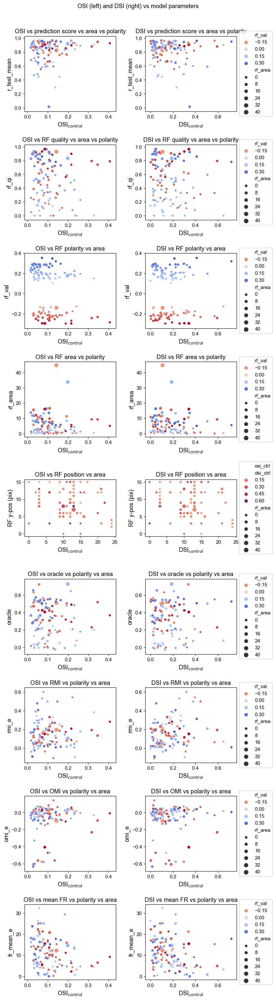

In [22]:
# Plot scatter plot of OSI/DSI (control) vs model prediction vs RF area
fig, axs = plt.subplots(nrows=9, ncols=2, figsize=cm2inch((20,70)), dpi=110)

# OSI/DSI vs r_test_mean
s = sns.scatterplot(data=udf, x='osi_ctrl', y='r_test_mean', size='rf_area', hue='rf_val', palette='coolwarm_r', legend=False, ax=axs[0,0])
axs[0,0].set_title('OSI vs prediction score vs area vs polarity')
# axs[0,0].plot([0, 1], [0, 1], color='grey', linestyle='--', transform=axs[0,0].transAxes, zorder=-1)

s = sns.scatterplot(data=udf, x='dsi_ctrl', y='r_test_mean', size='rf_area', hue='rf_val', palette='coolwarm_r', ax=axs[0,1])
axs[0,1].set_title('DSI vs prediction score vs area vs polarity')
s.legend(loc='center left', bbox_to_anchor=(1., 0.5))#, title='paramset')#, ncol=1)


# OSI/DSI vs RF quality
s = sns.scatterplot(data=udf, x='osi_ctrl', y='rf_qi', size='rf_area', hue='rf_val', palette='coolwarm_r', legend=False, ax=axs[1,0])
axs[1,0].set_title('OSI vs RF quality vs area vs polarity')
# axs[1,0].plot([0, 1], [0, 1], color='grey', linestyle='--', transform=axs[1,0].transAxes, zorder=-1);

s = sns.scatterplot(data=udf, x='dsi_ctrl', y='rf_qi', size='rf_area', hue='rf_val', palette='coolwarm_r', ax=axs[1,1])
axs[1,1].set_title('DSI vs RF quality vs area vs polarity')
s.legend(loc='center left', bbox_to_anchor=(1., 0.5))


# OSI/DSI vs RF val
s = sns.scatterplot(data=udf, x='osi_ctrl', y='rf_val', size='rf_area', hue='rf_val', palette='coolwarm_r', legend=False, ax=axs[2,0])
axs[2,0].set_title('OSI vs RF polarity vs area')

s = sns.scatterplot(data=udf, x='dsi_ctrl', y='rf_val', size='rf_area', hue='rf_val', palette='coolwarm_r', ax=axs[2,1])
axs[2,1].set_title('DSI vs RF polarity vs area')
s.legend(loc='center left', bbox_to_anchor=(1., 0.5))


# OSI/DSI vs RF area
s = sns.scatterplot(data=udf, x='osi_ctrl', y='rf_area', size='rf_area', hue='rf_val', palette='coolwarm_r', legend=False, ax=axs[3,0])
axs[3,0].set_title('OSI vs RF area vs polarity')

s = sns.scatterplot(data=udf, x='dsi_ctrl', y='rf_area', size='rf_area', hue='rf_val', palette='coolwarm_r', ax=axs[3,1])
axs[3,1].set_title('DSI vs RF area vs polarity')
s.legend(loc='center left', bbox_to_anchor=(1., 0.5))


# OSI/DSI vs RF position
x_pos = np.array([x for x,y in udf.rf_pos_pix.values])
y_pos = np.array([y for x,y in udf.rf_pos_pix.values])
s = sns.scatterplot(data=udf, x=x_pos, y=y_pos, size='rf_area', hue='osi_ctrl', palette='flare', legend=False, ax=axs[4,0])  # crest, rocket_r
axs[4,0].set_title('OSI vs RF position vs area')
axs[4,0].set_xlabel('RF x-pos (pix)')
axs[4,0].set_ylabel('RF y-pos (pix)')
axs[4,0].set_aspect('equal')

s = sns.scatterplot(data=udf, x=x_pos, y=y_pos, size='rf_area', hue='dsi_ctrl', palette='flare', ax=axs[4,1])
l = s.legend(loc='center left', bbox_to_anchor=(1., 0.5), title='osi_ctrl')#, ncol=1)
l.get_title().set_position((20, 0))
axs[4,1].set_title('DSI vs RF position vs area')
axs[4,1].set_xlabel('RF x-pos (pix)')
axs[4,1].set_ylabel('RF y-pos (pix)')
axs[4,1].set_aspect('equal')


# OSI/DSI vs oracle
s = sns.scatterplot(data=udf, x='osi_ctrl', y='oracle', size='rf_area', hue='rf_val', palette='coolwarm_r', legend=False, ax=axs[5,0])
axs[5,0].set_title('OSI vs oracle vs polarity vs area')

s = sns.scatterplot(data=udf, x='dsi_ctrl', y='oracle', size='rf_area', hue='rf_val', palette='coolwarm_r', legend=True, ax=axs[5,1])
l = s.legend(loc='center left', bbox_to_anchor=(1., 0.5))
axs[5,1].set_title('DSI vs oracle vs polarity vs area')


# OSI/DSI vs RMI
s = sns.scatterplot(data=udf, x='osi_ctrl', y='rmi_e', size='rf_area', hue='rf_val', palette='coolwarm_r', legend=False, ax=axs[6,0])
axs[6,0].set_title('OSI vs RMI vs polarity vs area')

s = sns.scatterplot(data=udf, x='dsi_ctrl', y='rmi_e', size='rf_area', hue='rf_val', palette='coolwarm_r', legend=True, ax=axs[6,1])
l = s.legend(loc='center left', bbox_to_anchor=(1., 0.5))
axs[6,1].set_title('DSI vs RMI vs polarity vs area')


# OSI/DSI vs OMI
s = sns.scatterplot(data=udf, x='osi_ctrl', y='omi_e', size='rf_area', hue='rf_val', palette='coolwarm_r', legend=False, ax=axs[7,0])
axs[7,0].set_title('OSI vs OMI vs polarity vs area')

s = sns.scatterplot(data=udf, x='dsi_ctrl', y='omi_e', size='rf_area', hue='rf_val', palette='coolwarm_r', legend=True, ax=axs[7,1])
l = s.legend(loc='center left', bbox_to_anchor=(1., 0.5))
axs[7,1].set_title('DSI vs OMI vs polarity vs area')


# OSI/DSI vs mean FR
s = sns.scatterplot(data=udf, x='osi_ctrl', y='fr_mean_e', size='rf_area', hue='rf_val', palette='coolwarm_r', legend=False, ax=axs[8,0])
axs[8,0].set_title('OSI vs mean FR vs polarity vs area')

s = sns.scatterplot(data=udf, x='dsi_ctrl', y='fr_mean_e', size='rf_area', hue='rf_val', palette='coolwarm_r', legend=True, ax=axs[8,1])
l = s.legend(loc='center left', bbox_to_anchor=(1., 0.5))
axs[8,1].set_title('DSI vs mean FR vs polarity vs area')


for ax in axs[:,0]: ax.set_xlabel(r'OSI$_{control}$')
for ax in axs[:,1]: ax.set_xlabel(r'DSI$_{control}$')

fig.suptitle('OSI (left) and DSI (right) vs model parameters', y=1.02)
fig.tight_layout()

Text(0.5, 0.98, 'OSI/DSI vs RF polarity (rf_val)')

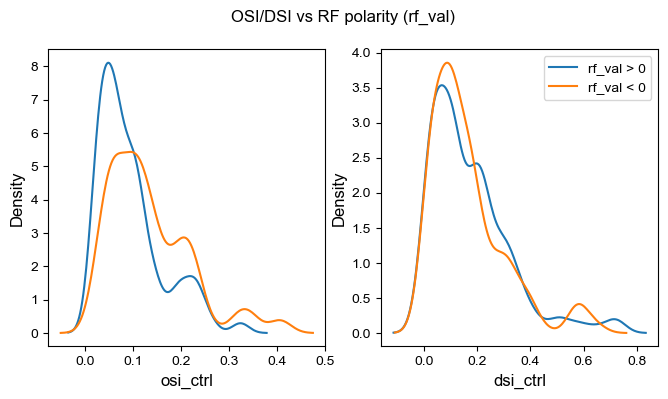

In [19]:
# Get OSI/DSI densities for ON vs OFF cells (by RF polarity = rf_val)
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=cm2inch((20,10)), dpi=100)

# Bottom marginal plots
sns.kdeplot(data=udf[udf.rf_val > 0], x='osi_ctrl', legend=True, label='rf_val > 0', ax=axs[0])
sns.kdeplot(data=udf[udf.rf_val < 0], x='osi_ctrl', legend=True, label='rf_val < 0', ax=axs[0])

sns.kdeplot(data=udf[udf.rf_val > 0], x='dsi_ctrl', legend=True, label='rf_val > 0', ax=axs[1])
s = sns.kdeplot(data=udf[udf.rf_val < 0], x='dsi_ctrl', legend=True, label='rf_val < 0', ax=axs[1])
plt.legend()#loc='center left', bbox_to_anchor=(1., 0.5))

fig.suptitle('OSI/DSI vs RF polarity (rf_val)')

Text(0.5, 0.98, 'OSI/DSI vs RF polarity (rf_val)')

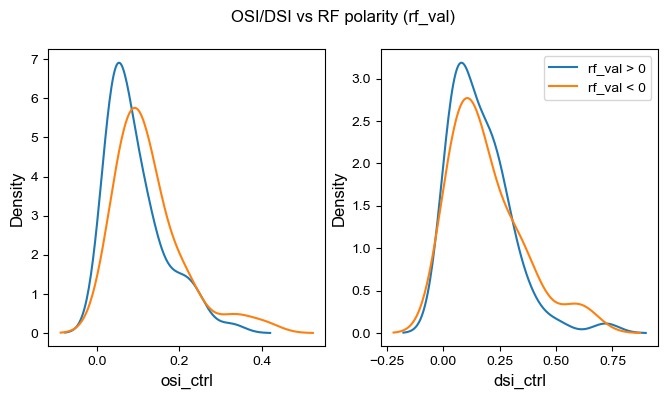

In [59]:
# Get OSI/DSI densities for ON vs OFF cells (by RF polarity = rf_val)
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=cm2inch((20,10)), dpi=100)

# Bottom marginal plots
sns.kdeplot(data=udf[udf.rf_val > 0], x='osi_ctrl', legend=True, label='rf_val > 0', ax=axs[0])
sns.kdeplot(data=udf[udf.rf_val < 0], x='osi_ctrl', legend=True, label='rf_val < 0', ax=axs[0])

sns.kdeplot(data=udf[udf.rf_val > 0], x='dsi_ctrl', legend=True, label='rf_val > 0', ax=axs[1])
s = sns.kdeplot(data=udf[udf.rf_val < 0], x='dsi_ctrl', legend=True, label='rf_val < 0', ax=axs[1])
plt.legend()#loc='center left', bbox_to_anchor=(1., 0.5))

fig.suptitle('OSI/DSI vs RF polarity (rf_val)')

### OSI/DSI opto vs control

In [48]:
udf.keys()

Index(['m', 's', 'u', 'chirp_type', 'osi_ctrl', 'osi_opto', 'dsi_ctrl', 'dsi_opto', 'sbc_zscore', 'sbc', 'wave_type', 'e', 'version', 'seq_num', 'fr_mean_e', 'fr_var_e', 'fr_mean_stim',
       'fr_mean_stim_ctrl', 'fr_var_stim_ctrl', 'fr_mean_stim_opto', 'fr_var_stim_opto', 'fr_mean_spont_ctrl', 'fr_var_spont_ctrl', 'fr_mean_spont_opto', 'fr_var_spont_opto', 'omi_e', 'omi_stim',
       'omi_spont', 'rmi_e', 'oracle', 'explainable_var', 'sta_corrected', 'ts', 'm_genotype', 's_region', 'paramset', 'r_train', 'r_test_mean', 'r_test_repeats', 'r2_train', 'r2_test_mean',
       'r2_test_repeats', 'fev', 'rf_qi', 'rf_thresh', 'rf_area', 'rf_pos_pix', 'rf_val'],
      dtype='object')

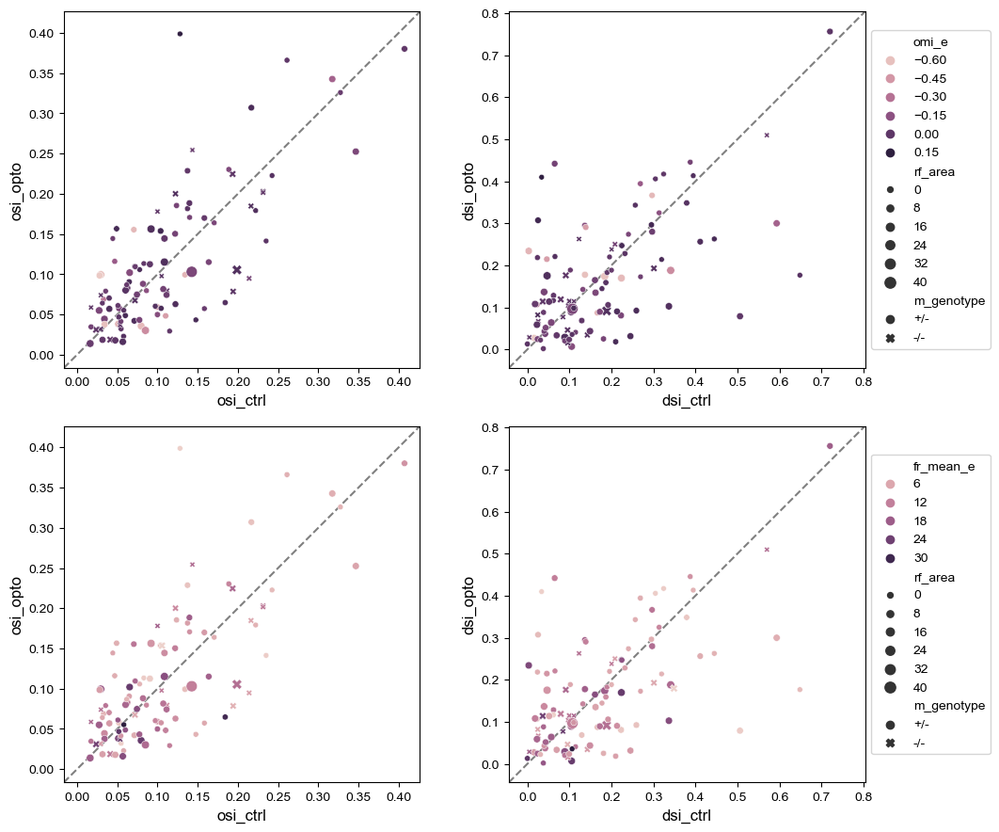

In [84]:
# Check OSI/DSI control vs opto (vs OMI and mean FR)
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=cm2inch((28,23)), dpi=100)

axs[0,0].set_aspect('equal')
axs[0,1].set_aspect('equal')
axs[1,0].set_aspect('equal')
axs[1,1].set_aspect('equal')

s = sns.scatterplot(data=udf, x='osi_ctrl', y='osi_opto', hue='omi_e', size='rf_area', style='m_genotype', legend=False, ax=axs[0,0])#, size='rf_area', hue='rf_val', palette='coolwarm_r', legend=False, ax=axs[0,0])
s = sns.scatterplot(data=udf, x='dsi_ctrl', y='dsi_opto', hue='omi_e', size='rf_area', style='m_genotype', ax=axs[0,1])
l = s.legend(loc='center left', bbox_to_anchor=(1., 0.5))#, ncol=3)

s = sns.scatterplot(data=udf, x='osi_ctrl', y='osi_opto', hue='fr_mean_e', size='rf_area', style='m_genotype', legend=False, ax=axs[1,0])
s = sns.scatterplot(data=udf, x='dsi_ctrl', y='dsi_opto', hue='fr_mean_e', size='rf_area',  style='m_genotype', ax=axs[1,1])
l = s.legend(loc='center left', bbox_to_anchor=(1., 0.5))#, ncol=3)


axs[0,0].set_xlim(axs[0,0].get_ylim())
axs[0,1].set_xlim(axs[0,1].get_ylim())
axs[1,0].set_xlim(axs[1,0].get_ylim())
axs[1,1].set_xlim(axs[1,1].get_ylim())


axs[0,0].plot([0, 1], [0, 1], color='grey', linestyle='--', transform=axs[0,0].transAxes, zorder=-1)
axs[0,1].plot([0, 1], [0, 1], color='grey', linestyle='--', transform=axs[0,1].transAxes, zorder=-1)
axs[1,0].plot([0, 1], [0, 1], color='grey', linestyle='--', transform=axs[1,0].transAxes, zorder=-1)
axs[1,1].plot([0, 1], [0, 1], color='grey', linestyle='--', transform=axs[1,1].transAxes, zorder=-1)

fig.tight_layout()

### Check for OSI/DSI batch effects

Text(0.5, 1.0, 'DSI vs model prediction by mouse')

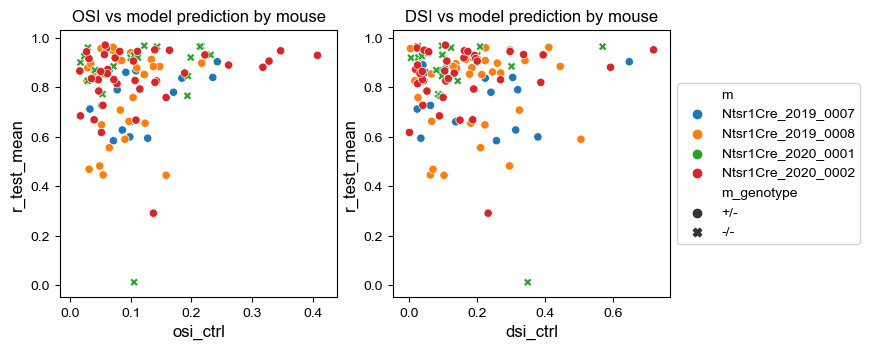

In [105]:
# Plot scatter plot of OSI/DSI (control) vs model prediction by mouse
fig, axs = plt.subplots(1,2, figsize=cm2inch((20,9)), dpi=100)

sns.scatterplot(data=df, x='osi_ctrl', y='r_test_mean', hue='m', style='m_genotype', legend=False, ax=axs[0])
axs[0].set_title('OSI vs model prediction by mouse')

s = sns.scatterplot(data=df, x='dsi_ctrl', y='r_test_mean', hue='m',style='m_genotype', ax=axs[1])
l = s.legend(loc='center left', bbox_to_anchor=[1.0,0.5])
# l = s.legend(loc='center left', bbox_to_anchor=(1., 0.5))
axs[1].set_title('DSI vs model prediction by mouse')

### Check units with outlier RF areas

1


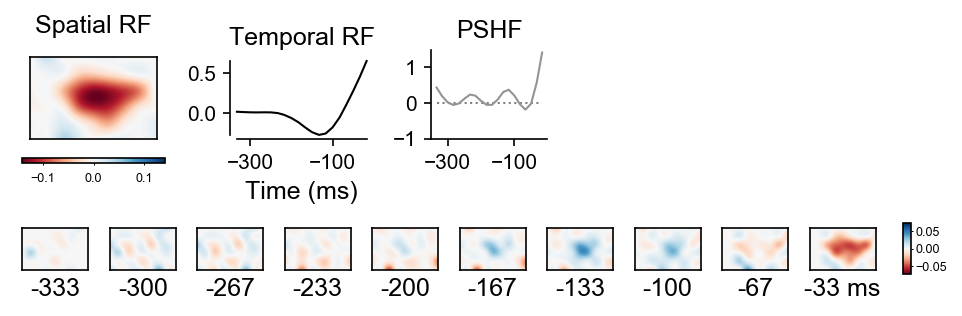

In [23]:
from djd.hmov_models import plot_rf_filters

# Get unit with large(st) RF area
df = udf.loc[[udf.rf_area.idxmax()]]  # use sort_values to get list
print(len(df))

for i, unit in df.head(n=len(df)).iterrows():
    models = pd.DataFrame((SplineLNP() & unit.loc['m':'u'].to_dict()).fetch(dj.key, as_dict=True))
    key = get_best_model(models, keys_only=True)
    plot_rf_filters(key.to_dict('records')[0], figsize=(16, 5))
    plt.show()

## Hmov model X chirp_type
TODO: try using all models (not just best) to boost n

In [48]:
udf.keys()

Index(['m', 's', 'u', 'chirp_type', 'osi_ctrl', 'osi_opto', 'dsi_ctrl', 'dsi_opto', 'sbc_zscore', 'sbc', 'wave_type', 'e', 'version', 'seq_num', 'fr_mean_e', 'fr_var_e', 'fr_mean_stim',
       'fr_mean_stim_ctrl', 'fr_var_stim_ctrl', 'fr_mean_stim_opto', 'fr_var_stim_opto', 'fr_mean_spont_ctrl', 'fr_var_spont_ctrl', 'fr_mean_spont_opto', 'fr_var_spont_opto', 'omi_e', 'omi_stim',
       'omi_spont', 'rmi_e', 'oracle', 'explainable_var', 'sta_corrected', 'ts', 'm_genotype', 's_region', 'paramset', 'r_train', 'r_test_mean', 'r_test_repeats', 'r2_train', 'r2_test_mean',
       'r2_test_repeats', 'fev', 'rf_qi', 'rf_thresh', 'rf_area', 'rf_pos_pix', 'rf_val'],
      dtype='object')

Classified chirp cells: n = 88
Unclassified chirp cells (NaN): n = 33


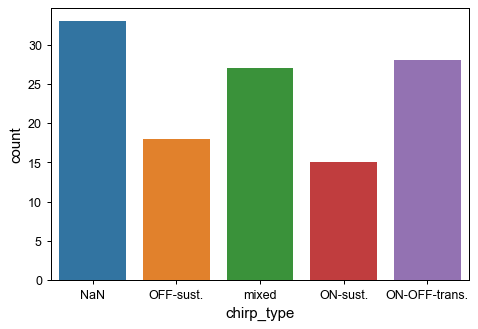

In [66]:
# Quantify chirp-classified units
# NOTE: NaN chirp types are likely low SNR cells that would not pass quality threshold

print(f'Classified chirp cells: n = {udf["chirp_type"].notna().sum()}')
print(f'Unclassified chirp cells (NaN): n = {udf["chirp_type"].isna().sum()}')

# Show NaNs in plot
df = udf.copy()
df['chirp_type'] = df['chirp_type'].fillna('NaN')

fig, axs = plt.subplots(nrows=1, ncols=1, dpi=90) #figsize=cm2inch((20,70))
ax = sns.countplot(data=df, x='chirp_type', ax=axs)

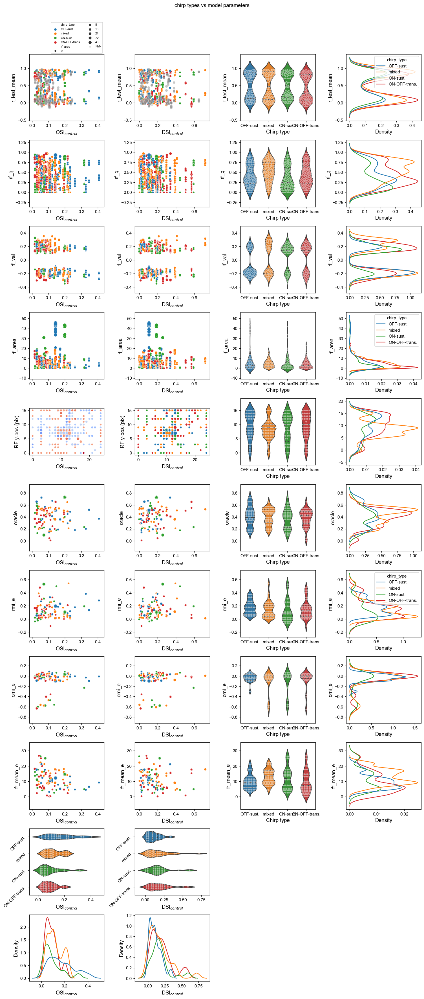

In [21]:
# Plot scatter plot of OSI/DSI (control) vs model
fig, axs = plt.subplots(nrows=11, ncols=4, figsize=cm2inch((35,80)), dpi=110)

for r in range(9):  # sharey axis in every row
    if r != 4:
        axs[r,0].get_shared_y_axes().join(axs[r,0], axs[r,1], axs[r,2], axs[r,3])


# r_test_mean
s = sns.scatterplot(data=udf, x='osi_ctrl', y='r_test_mean', size='rf_area', hue='chirp_type', palette='tab10', legend=True, ax=axs[0,0])
sns.scatterplot(data=udf[udf.chirp_type.isna()], x='osi_ctrl', y='r_test_mean', color='grey', alpha=0.25, label='NaN', legend=True, ax=axs[0,0])
l = s.legend(loc='top left', bbox_to_anchor=[1.0,1.5], ncol=2, fontsize=7, markerscale=0.75)
s = sns.scatterplot(data=udf, x='dsi_ctrl', y='r_test_mean', size='rf_area', hue='chirp_type', palette='tab10', legend=False, ax=axs[0,1])
sns.scatterplot(data=udf[udf.chirp_type.isna()], x='dsi_ctrl', y='r_test_mean', color='grey', alpha=0.25, label='NaN', legend=False, ax=axs[0,1])
sns.violinplot(data=udf, x='chirp_type', y='r_test_mean', inner='quartile', ax=axs[0,2])
sns.swarmplot(data=udf, x='chirp_type', y='r_test_mean', color='white', edgecolor='gray', alpha=0.5, size=3.5, ax=axs[0,2])
sns.kdeplot(data=udf, y='r_test_mean', hue='chirp_type', ax=axs[0,3])


# RF quality
s = sns.scatterplot(data=udf, x='osi_ctrl', y='rf_qi', size='rf_area', hue='chirp_type', palette='tab10', legend=False, ax=axs[1,0])
s = sns.scatterplot(data=udf, x='dsi_ctrl', y='rf_qi', size='rf_area', hue='chirp_type', palette='tab10', legend=False, ax=axs[1,1])
sns.violinplot(data=udf, x='chirp_type', y='rf_qi', inner='quartile', ax=axs[1,2])
sns.swarmplot(data=udf, x='chirp_type', y='rf_qi', color='white', edgecolor='gray', alpha=0.5, size=3.5, ax=axs[1,2])
sns.kdeplot(data=udf, y='rf_qi', hue='chirp_type', legend=False, ax=axs[1,3])


# RF val
s = sns.scatterplot(data=udf, x='osi_ctrl', y='rf_val', size='rf_area', hue='chirp_type', palette='tab10', legend=False, ax=axs[2,0])
s = sns.scatterplot(data=udf, x='dsi_ctrl', y='rf_val', size='rf_area', hue='chirp_type', palette='tab10', legend=False, ax=axs[2,1])
sns.violinplot(data=udf, x='chirp_type', y='rf_val', inner='quartile', bw=0.2, ax=axs[2,2])
sns.swarmplot(data=udf, x='chirp_type', y='rf_val', color='white', edgecolor='gray', alpha=0.5, size=3.5, ax=axs[2,2])
sns.kdeplot(data=udf, y='rf_val', hue='chirp_type',  bw_adjust=0.5, legend=False, ax=axs[2,3])


# RF area
s = sns.scatterplot(data=udf, x='osi_ctrl', y='rf_area', size='rf_area', hue='chirp_type', palette='tab10', legend=False, ax=axs[3,0])
s = sns.scatterplot(data=udf, x='dsi_ctrl', y='rf_area', size='rf_area', hue='chirp_type', palette='tab10', legend=False, ax=axs[3,1])
sns.violinplot(data=udf, x='chirp_type', y='rf_area', inner='quartile', ax=axs[3,2])
sns.swarmplot(data=udf, x='chirp_type', y='rf_area', color='white', edgecolor='gray', alpha=0.5, size=3.5, ax=axs[3,2])
sns.kdeplot(data=udf, y='rf_area', hue='chirp_type', legend=True, ax=axs[3,3])


# RF position
x_pos = np.array([x for x,y in udf.rf_pos_pix.values])
y_pos = np.array([y for x,y in udf.rf_pos_pix.values])
s = sns.scatterplot(data=udf, x=x_pos, y=y_pos, size='rf_area', hue='rf_val', palette='coolwarm_r', legend=False, ax=axs[4,0])  # crest, rocket_r
axs[4,0].set_xlabel('RF x-pos (pix)')
axs[4,0].set_ylabel('RF y-pos (pix)')
axs[4,0].set_aspect('equal')
s = sns.scatterplot(data=udf, x=x_pos, y=y_pos, size='rf_area', hue='chirp_type', palette='tab10', legend=False, ax=axs[4,1])
axs[4,1].set_xlabel('RF x-pos (pix)')
axs[4,1].set_ylabel('RF y-pos (pix)')
axs[4,1].set_aspect('equal')
sns.violinplot(data=udf, x='chirp_type', y=y_pos, inner='quartile', ax=axs[4,2])
sns.swarmplot(data=udf, x='chirp_type', y=y_pos, color='white', edgecolor='gray', alpha=0.5, size=3.5, ax=axs[4,2])
sns.kdeplot(data=udf, y=y_pos, hue='chirp_type', legend=False, ax=axs[4,3])


# oracle
s = sns.scatterplot(data=udf, x='osi_ctrl', y='oracle', size='rf_area', hue='chirp_type', palette='tab10', legend=False, ax=axs[5,0])
s = sns.scatterplot(data=udf, x='dsi_ctrl', y='oracle', size='rf_area', hue='chirp_type', palette='tab10', legend=False, ax=axs[5,1])
sns.violinplot(data=udf, x='chirp_type', y='oracle', inner='quartile', ax=axs[5,2])
sns.swarmplot(data=udf, x='chirp_type', y='oracle', color='white', edgecolor='gray', alpha=0.5, size=3.5, ax=axs[5,2])
sns.kdeplot(data=udf, y='oracle', hue='chirp_type', legend=False, ax=axs[5,3])


# RMI
s = sns.scatterplot(data=udf, x='osi_ctrl', y='rmi_e', size='rf_area', hue='chirp_type', palette='tab10', legend=False, ax=axs[6,0])
s = sns.scatterplot(data=udf, x='dsi_ctrl', y='rmi_e', size='rf_area', hue='chirp_type', palette='tab10', legend=False, ax=axs[6,1])
sns.violinplot(data=udf, x='chirp_type', y='rmi_e', inner='quartile', ax=axs[6,2])
sns.swarmplot(data=udf, x='chirp_type', y='rmi_e', color='white', edgecolor='gray', alpha=0.5, size=3.5, ax=axs[6,2])
sns.kdeplot(data=udf, y='rmi_e', hue='chirp_type', legend=True, ax=axs[6,3])


# OMI
s = sns.scatterplot(data=udf, x='osi_ctrl', y='omi_e', size='rf_area', hue='chirp_type', palette='tab10', legend=False, ax=axs[7,0])
s = sns.scatterplot(data=udf, x='dsi_ctrl', y='omi_e', size='rf_area', hue='chirp_type', palette='tab10', legend=False, ax=axs[7,1])
sns.violinplot(data=udf, x='chirp_type', y='omi_e', inner='quartile', ax=axs[7,2])
sns.swarmplot(data=udf, x='chirp_type', y='omi_e', color='white', edgecolor='gray', alpha=0.5, size=3.5, ax=axs[7,2])
sns.kdeplot(data=udf, y='omi_e', hue='chirp_type', legend=False, ax=axs[7,3])


# mean FR
s = sns.scatterplot(data=udf, x='osi_ctrl', y='fr_mean_e', size='rf_area', hue='chirp_type', palette='tab10', legend=False, ax=axs[8,0])
s = sns.scatterplot(data=udf, x='dsi_ctrl', y='fr_mean_e', size='rf_area', hue='chirp_type', palette='tab10', legend=False, ax=axs[8,1])
sns.violinplot(data=udf, x='chirp_type', y='fr_mean_e', inner='quartile', ax=axs[8,2])
sns.swarmplot(data=udf, x='chirp_type', y='fr_mean_e', color='white', edgecolor='gray', alpha=0.5, size=3.5, ax=axs[8,2])
sns.kdeplot(data=udf, y='fr_mean_e', hue='chirp_type', legend=False, ax=axs[8,3])

# Bottom marginal plots
sns.violinplot(data=udf, x='osi_ctrl', y='chirp_type', inner='quartile', ax=axs[9,0])
sns.swarmplot(data=udf, x='osi_ctrl', y='chirp_type', color='white', edgecolor='gray', alpha=0.5, size=3.5, ax=axs[9,0])
sns.kdeplot(data=udf, x='osi_ctrl', hue='chirp_type', legend=False, ax=axs[10,0])
axs[9,0].set_ylabel('')
plt.setp(axs[9,0].get_yticklabels(), rotation=45)

sns.violinplot(data=udf, x='dsi_ctrl', y='chirp_type', inner='quartile', ax=axs[9,1])
sns.swarmplot(data=udf, x='dsi_ctrl', y='chirp_type', color='white', edgecolor='gray', alpha=0.5, size=3.5, ax=axs[9,1])
sns.kdeplot(data=udf, x='dsi_ctrl', hue='chirp_type', legend=False, ax=axs[10,1])
axs[9,1].set_ylabel('')
plt.setp(axs[9,1].get_yticklabels(), rotation=45)

for ax in axs[:,0]: ax.set_xlabel(r'OSI$_{control}$')
for ax in axs[:,1]: ax.set_xlabel(r'DSI$_{control}$')
for ax in axs[:,2]: ax.set_xlabel('Chirp type')

axs[9,2].set_visible(False)
axs[9,3].set_visible(False)
axs[10,2].set_visible(False)
axs[10,3].set_visible(False)

fig.suptitle('chirp types vs model parameters', y=1.02)
fig.tight_layout()

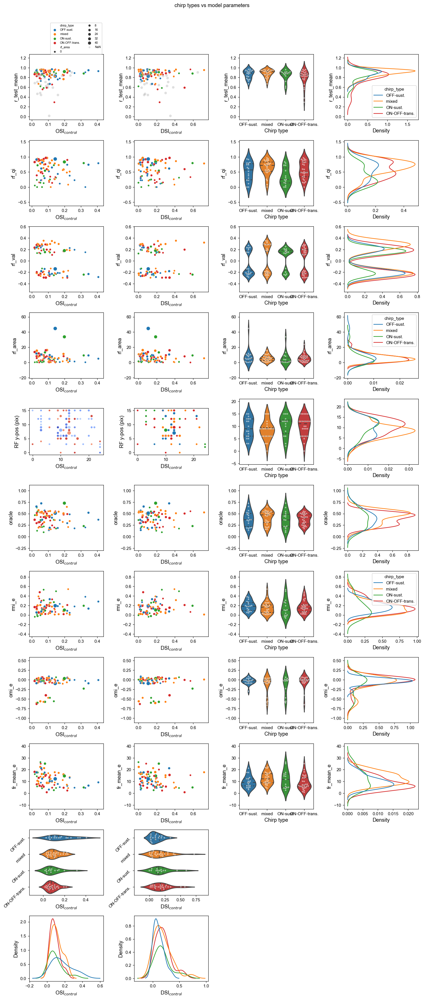

In [39]:
# Plot scatter plot of OSI/DSI (control) vs model
fig, axs = plt.subplots(nrows=11, ncols=4, figsize=cm2inch((35,80)), dpi=110)

for r in range(9):  # sharey axis in every row
    if r != 4:
        axs[r,0].get_shared_y_axes().join(axs[r,0], axs[r,1], axs[r,2], axs[r,3])


# r_test_mean
s = sns.scatterplot(data=udf, x='osi_ctrl', y='r_test_mean', size='rf_area', hue='chirp_type', palette='tab10', legend=True, ax=axs[0,0])
sns.scatterplot(data=udf[udf.chirp_type.isna()], x='osi_ctrl', y='r_test_mean', color='grey', alpha=0.25, label='NaN', legend=True, ax=axs[0,0])
l = s.legend(loc='top left', bbox_to_anchor=[1.0,1.5], ncol=2, fontsize=7, markerscale=0.75)
s = sns.scatterplot(data=udf, x='dsi_ctrl', y='r_test_mean', size='rf_area', hue='chirp_type', palette='tab10', legend=False, ax=axs[0,1])
sns.scatterplot(data=udf[udf.chirp_type.isna()], x='dsi_ctrl', y='r_test_mean', color='grey', alpha=0.25, label='NaN', legend=False, ax=axs[0,1])
sns.violinplot(data=udf, x='chirp_type', y='r_test_mean', inner='quartile', ax=axs[0,2])
sns.swarmplot(data=udf, x='chirp_type', y='r_test_mean', color='white', edgecolor='gray', alpha=0.5, size=3.5, ax=axs[0,2])
sns.kdeplot(data=udf, y='r_test_mean', hue='chirp_type', ax=axs[0,3])


# RF quality
s = sns.scatterplot(data=udf, x='osi_ctrl', y='rf_qi', size='rf_area', hue='chirp_type', palette='tab10', legend=False, ax=axs[1,0])
s = sns.scatterplot(data=udf, x='dsi_ctrl', y='rf_qi', size='rf_area', hue='chirp_type', palette='tab10', legend=False, ax=axs[1,1])
sns.violinplot(data=udf, x='chirp_type', y='rf_qi', inner='quartile', ax=axs[1,2])
sns.swarmplot(data=udf, x='chirp_type', y='rf_qi', color='white', edgecolor='gray', alpha=0.5, size=3.5, ax=axs[1,2])
sns.kdeplot(data=udf, y='rf_qi', hue='chirp_type', legend=False, ax=axs[1,3])


# RF val
s = sns.scatterplot(data=udf, x='osi_ctrl', y='rf_val', size='rf_area', hue='chirp_type', palette='tab10', legend=False, ax=axs[2,0])
s = sns.scatterplot(data=udf, x='dsi_ctrl', y='rf_val', size='rf_area', hue='chirp_type', palette='tab10', legend=False, ax=axs[2,1])
sns.violinplot(data=udf, x='chirp_type', y='rf_val', inner='quartile', bw=0.2, ax=axs[2,2])
sns.swarmplot(data=udf, x='chirp_type', y='rf_val', color='white', edgecolor='gray', alpha=0.5, size=3.5, ax=axs[2,2])
sns.kdeplot(data=udf, y='rf_val', hue='chirp_type',  bw_adjust=0.5, legend=False, ax=axs[2,3])


# RF area
s = sns.scatterplot(data=udf, x='osi_ctrl', y='rf_area', size='rf_area', hue='chirp_type', palette='tab10', legend=False, ax=axs[3,0])
s = sns.scatterplot(data=udf, x='dsi_ctrl', y='rf_area', size='rf_area', hue='chirp_type', palette='tab10', legend=False, ax=axs[3,1])
sns.violinplot(data=udf, x='chirp_type', y='rf_area', inner='quartile', ax=axs[3,2])
sns.swarmplot(data=udf, x='chirp_type', y='rf_area', color='white', edgecolor='gray', alpha=0.5, size=3.5, ax=axs[3,2])
sns.kdeplot(data=udf, y='rf_area', hue='chirp_type', legend=True, ax=axs[3,3])


# RF position
x_pos = np.array([x for x,y in udf.rf_pos_pix.values])
y_pos = np.array([y for x,y in udf.rf_pos_pix.values])
s = sns.scatterplot(data=udf, x=x_pos, y=y_pos, size='rf_area', hue='rf_val', palette='coolwarm_r', legend=False, ax=axs[4,0])  # crest, rocket_r
axs[4,0].set_xlabel('RF x-pos (pix)')
axs[4,0].set_ylabel('RF y-pos (pix)')
axs[4,0].set_aspect('equal')
s = sns.scatterplot(data=udf, x=x_pos, y=y_pos, size='rf_area', hue='chirp_type', palette='tab10', legend=False, ax=axs[4,1])
axs[4,1].set_xlabel('RF x-pos (pix)')
axs[4,1].set_ylabel('RF y-pos (pix)')
axs[4,1].set_aspect('equal')
sns.violinplot(data=udf, x='chirp_type', y=y_pos, inner='quartile', ax=axs[4,2])
sns.swarmplot(data=udf, x='chirp_type', y=y_pos, color='white', edgecolor='gray', alpha=0.5, size=3.5, ax=axs[4,2])
sns.kdeplot(data=udf, y=y_pos, hue='chirp_type', legend=False, ax=axs[4,3])


# oracle
s = sns.scatterplot(data=udf, x='osi_ctrl', y='oracle', size='rf_area', hue='chirp_type', palette='tab10', legend=False, ax=axs[5,0])
s = sns.scatterplot(data=udf, x='dsi_ctrl', y='oracle', size='rf_area', hue='chirp_type', palette='tab10', legend=False, ax=axs[5,1])
sns.violinplot(data=udf, x='chirp_type', y='oracle', inner='quartile', ax=axs[5,2])
sns.swarmplot(data=udf, x='chirp_type', y='oracle', color='white', edgecolor='gray', alpha=0.5, size=3.5, ax=axs[5,2])
sns.kdeplot(data=udf, y='oracle', hue='chirp_type', legend=False, ax=axs[5,3])


# RMI
s = sns.scatterplot(data=udf, x='osi_ctrl', y='rmi_e', size='rf_area', hue='chirp_type', palette='tab10', legend=False, ax=axs[6,0])
s = sns.scatterplot(data=udf, x='dsi_ctrl', y='rmi_e', size='rf_area', hue='chirp_type', palette='tab10', legend=False, ax=axs[6,1])
sns.violinplot(data=udf, x='chirp_type', y='rmi_e', inner='quartile', ax=axs[6,2])
sns.swarmplot(data=udf, x='chirp_type', y='rmi_e', color='white', edgecolor='gray', alpha=0.5, size=3.5, ax=axs[6,2])
sns.kdeplot(data=udf, y='rmi_e', hue='chirp_type', legend=True, ax=axs[6,3])


# OMI
s = sns.scatterplot(data=udf, x='osi_ctrl', y='omi_e', size='rf_area', hue='chirp_type', palette='tab10', legend=False, ax=axs[7,0])
s = sns.scatterplot(data=udf, x='dsi_ctrl', y='omi_e', size='rf_area', hue='chirp_type', palette='tab10', legend=False, ax=axs[7,1])
sns.violinplot(data=udf, x='chirp_type', y='omi_e', inner='quartile', ax=axs[7,2])
sns.swarmplot(data=udf, x='chirp_type', y='omi_e', color='white', edgecolor='gray', alpha=0.5, size=3.5, ax=axs[7,2])
sns.kdeplot(data=udf, y='omi_e', hue='chirp_type', legend=False, ax=axs[7,3])


# mean FR
s = sns.scatterplot(data=udf, x='osi_ctrl', y='fr_mean_e', size='rf_area', hue='chirp_type', palette='tab10', legend=False, ax=axs[8,0])
s = sns.scatterplot(data=udf, x='dsi_ctrl', y='fr_mean_e', size='rf_area', hue='chirp_type', palette='tab10', legend=False, ax=axs[8,1])
sns.violinplot(data=udf, x='chirp_type', y='fr_mean_e', inner='quartile', ax=axs[8,2])
sns.swarmplot(data=udf, x='chirp_type', y='fr_mean_e', color='white', edgecolor='gray', alpha=0.5, size=3.5, ax=axs[8,2])
sns.kdeplot(data=udf, y='fr_mean_e', hue='chirp_type', legend=False, ax=axs[8,3])

# Bottom marginal plots
sns.violinplot(data=udf, x='osi_ctrl', y='chirp_type', inner='quartile', ax=axs[9,0])
sns.swarmplot(data=udf, x='osi_ctrl', y='chirp_type', color='white', edgecolor='gray', alpha=0.5, size=3.5, ax=axs[9,0])
sns.kdeplot(data=udf, x='osi_ctrl', hue='chirp_type', legend=False, ax=axs[10,0])
axs[9,0].set_ylabel('')
plt.setp(axs[9,0].get_yticklabels(), rotation=45)

sns.violinplot(data=udf, x='dsi_ctrl', y='chirp_type', inner='quartile', ax=axs[9,1])
sns.swarmplot(data=udf, x='dsi_ctrl', y='chirp_type', color='white', edgecolor='gray', alpha=0.5, size=3.5, ax=axs[9,1])
sns.kdeplot(data=udf, x='dsi_ctrl', hue='chirp_type', legend=False, ax=axs[10,1])
axs[9,1].set_ylabel('')
plt.setp(axs[9,1].get_yticklabels(), rotation=45)

for ax in axs[:,0]: ax.set_xlabel(r'OSI$_{control}$')
for ax in axs[:,1]: ax.set_xlabel(r'DSI$_{control}$')
for ax in axs[:,2]: ax.set_xlabel('Chirp type')

axs[9,2].set_visible(False)
axs[9,3].set_visible(False)
axs[10,2].set_visible(False)
axs[10,3].set_visible(False)

fig.suptitle('chirp types vs model parameters', y=1.02)
fig.tight_layout()

### Check outlier polarity units
- OFF-sust. and RF polarity > 0
- ON-sust. and RF polarity < 0

In [19]:
df = udf[(udf.chirp_type=='ON-sust.') & (udf.rf_val < 0)]
df.iloc[-1]

m                                                    Ntsr1Cre_2020_0002
s                                                                     6
u                                                                    27
chirp_type                                                     ON-sust.
osi_ctrl                                                      0.0617807
osi_opto                                                      0.0869163
dsi_ctrl                                                      0.0314007
dsi_opto                                                        0.02241
sbc_zscore                                                  -0.00181841
sbc                                                               False
wave_type                                                         excit
e                                                                     6
version                                                               3
seq_num                                                         

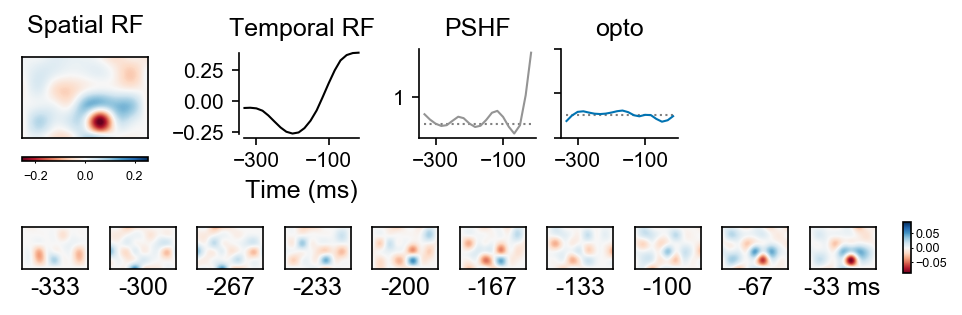

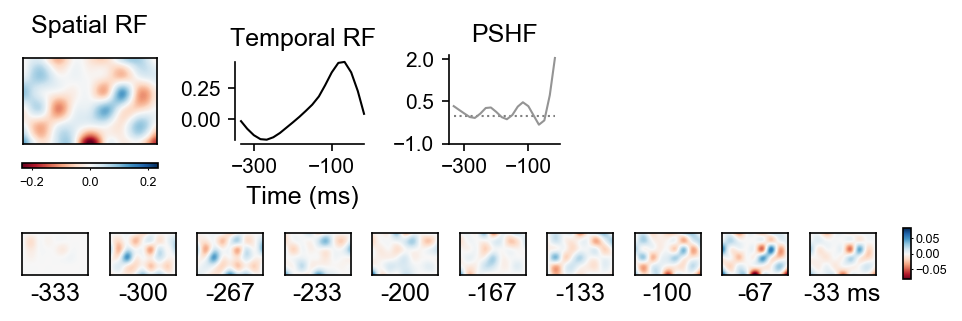

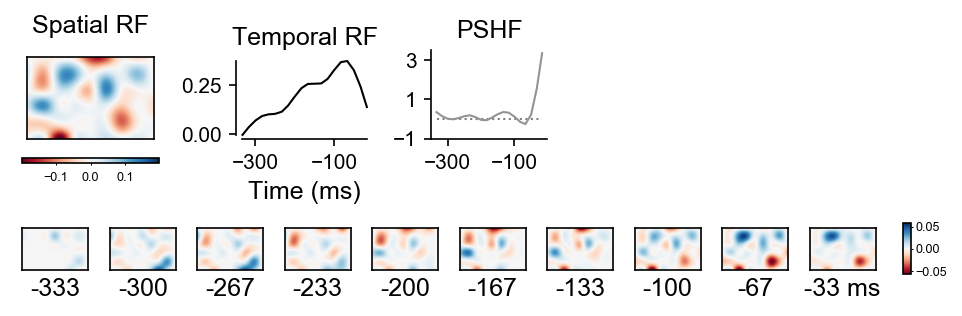

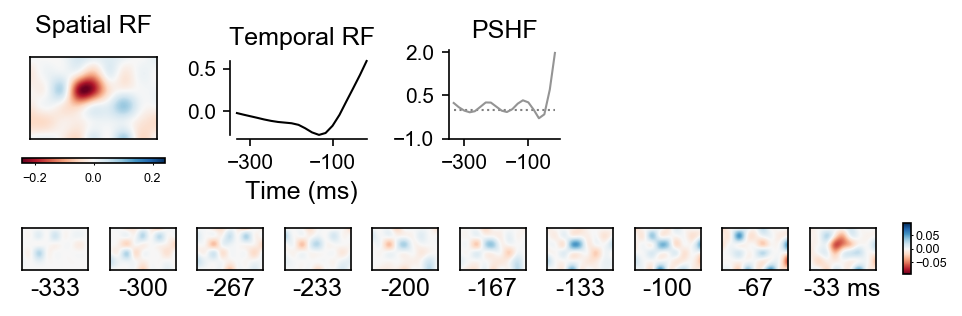

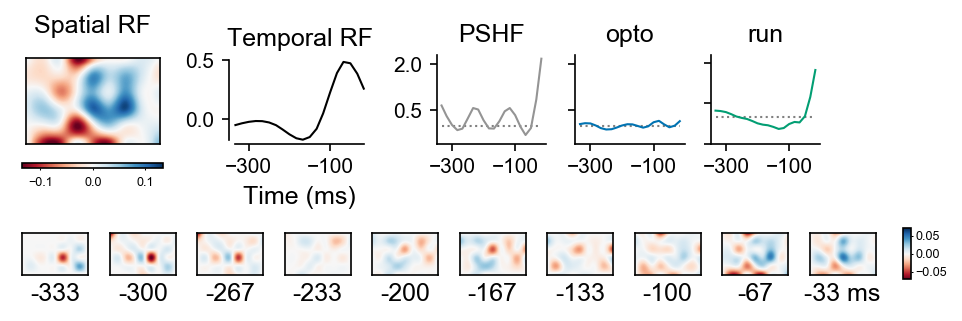

In [81]:
from djd.hmov_models import plot_RF, plot_rf_filters

# Check ON-sust units with a negative RF polarity
df = udf[(udf.chirp_type=='ON-sust.') & (udf.rf_val < 0)]
print(len(df))

for i, unit in df.head(n=len(df)).iterrows():
    models = pd.DataFrame((SplineLNP() & unit.loc['m':'u'].to_dict()).fetch(dj.key, as_dict=True))
    key = get_best_model(models, keys_only=True)
    plot_rf_filters(key.to_dict('records')[0], figsize=(16, 5))
    plt.show()

7


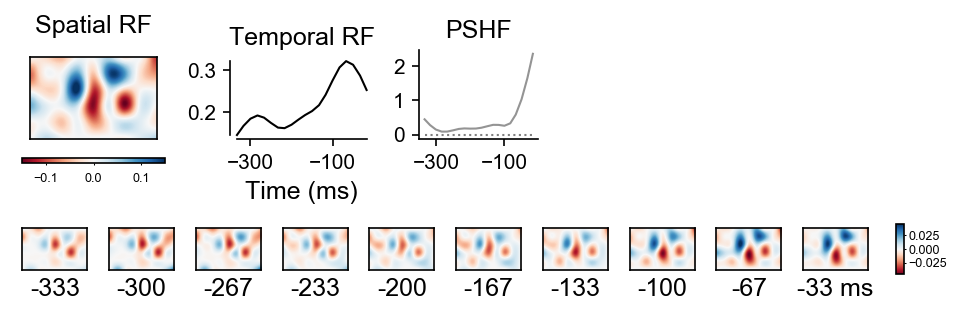

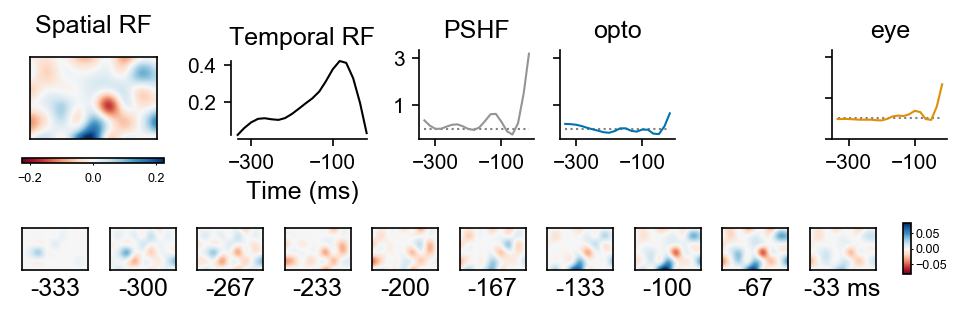

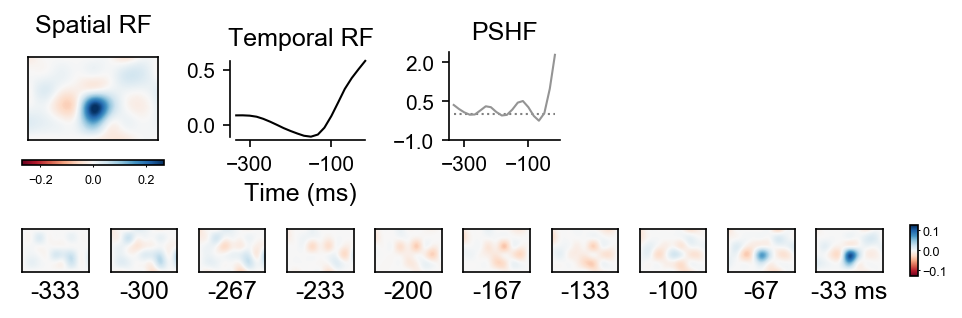

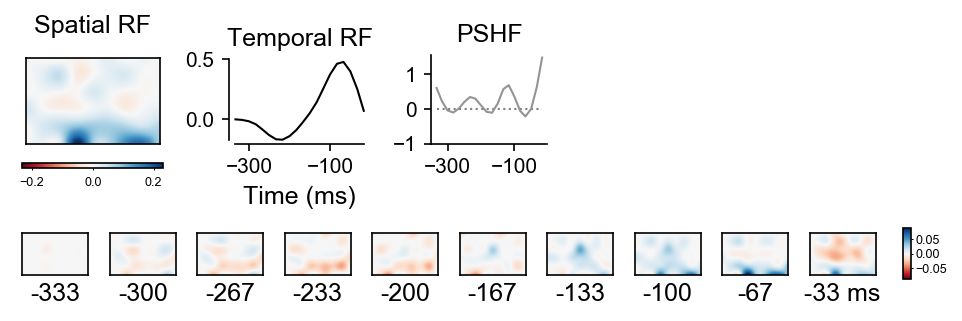

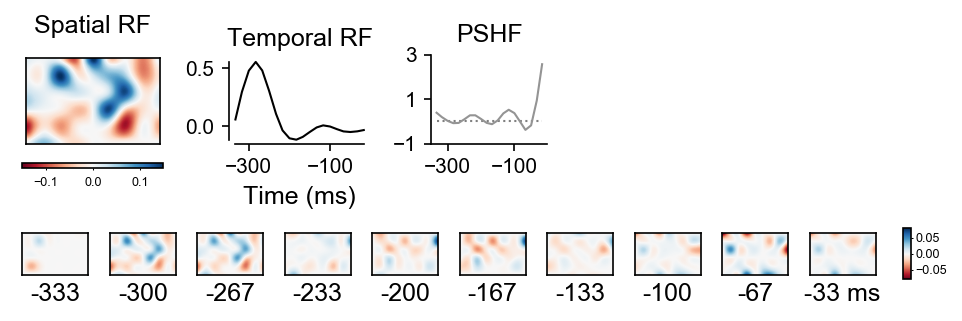

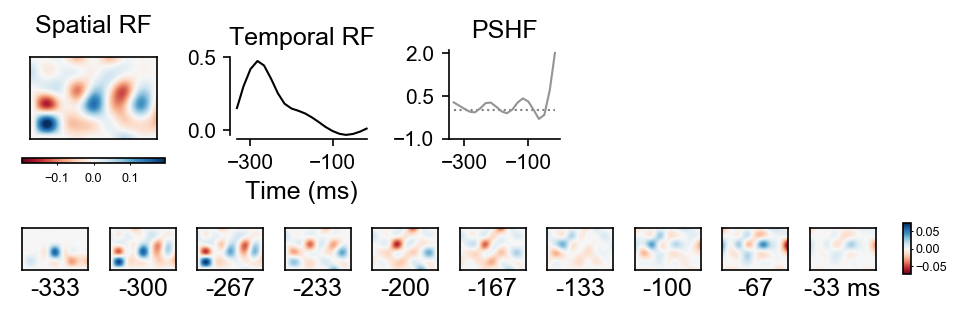

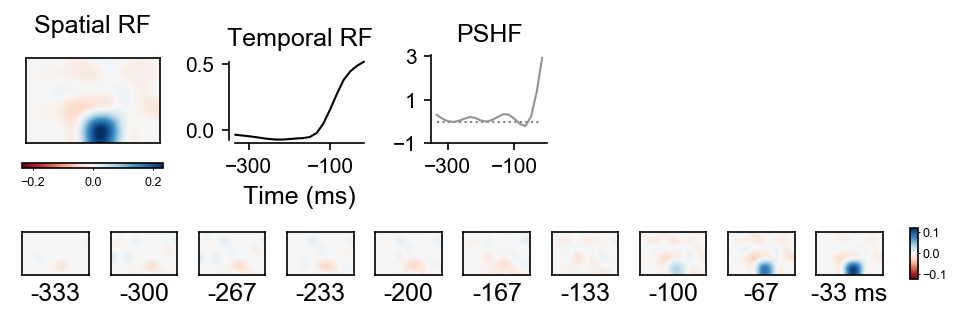

In [84]:
from djd.hmov_models import plot_RF, plot_rf_filters

# Check OFF-sust units with a positive RF polarity
df = udf[(udf.chirp_type=='OFF-sust.') & (udf.rf_val > 0)]
print(len(df))

for i, unit in df.head(n=len(df)).iterrows():
    models = pd.DataFrame((SplineLNP() & unit.loc['m':'u'].to_dict()).fetch(dj.key, as_dict=True))
    key = get_best_model(models, keys_only=True)
    plot_rf_filters(key.to_dict('records')[0], figsize=(16, 5))
    plt.show()

### Focus on one variable

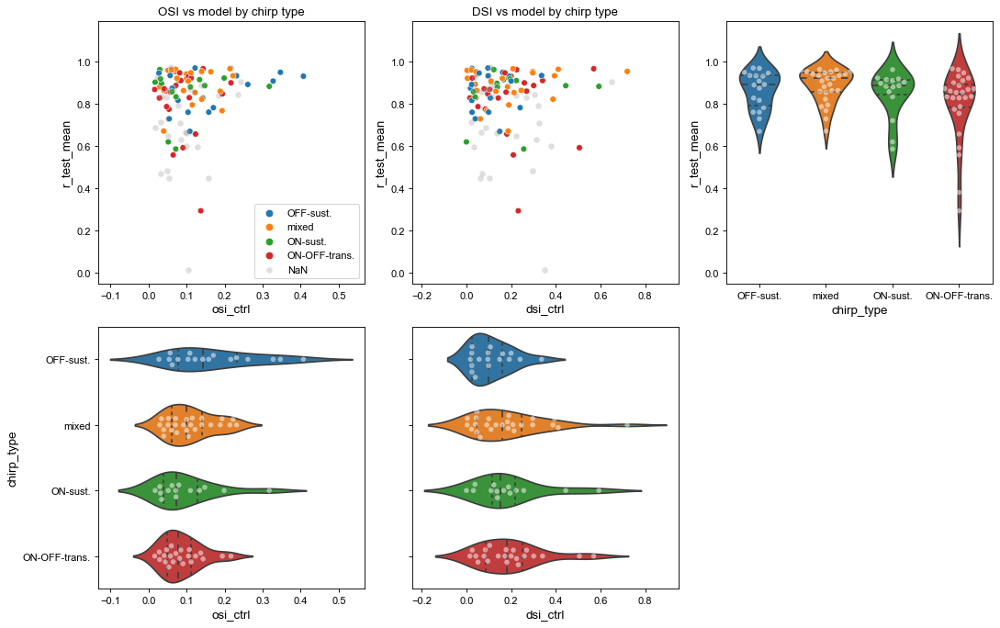

In [119]:
# Plot scatter plot of OSI/DSI (control) vs model prediction by chirp type
# NOTE: using seaborn seems more efficient than having to hard code each type or looping through the df.groupby('chirp_type')
fig, axs = plt.subplots(2,3, figsize=cm2inch((35,22)), dpi=80, sharex=False, sharey=False)

var = 'r_test_mean'

sns.scatterplot(data=udf, x='osi_ctrl', y=var, hue='chirp_type', ax=axs[0,0])
sns.scatterplot(data=udf[udf.chirp_type.isna()], x='osi_ctrl', y=var, color='grey', alpha=0.25, label='NaN', ax=axs[0,0])
# axs[0,0].plot([0, 1], [0, 1], color='grey', linestyle='--', transform=axs[0,0].transAxes, zorder=-1)
axs[0,0].set_title('OSI vs model by chirp type')
# axs[0,0].set_xlim(-0.1,1)
# axs[0,0].set_ylim(-0.05,0.8)

# axs[0,1].get_shared_x_axes().join(axs[0,0], axs[0,1])
sns.scatterplot(data=udf, x='dsi_ctrl', y=var, hue='chirp_type', legend=False, ax=axs[0,1])
sns.scatterplot(data=udf[udf.chirp_type.isna()], x='dsi_ctrl', y=var, color='grey', alpha=0.25, label='NaN', legend=False, ax=axs[0,1])
# axs[0,1].plot([0, 1], [0, 1], color='grey', linestyle='--', transform=axs[0,1].transAxes, zorder=-1)
axs[0,1].set_title('DSI vs model by chirp type')
# axs[0,1].set_xlim(-0.1,1)
# axs[0,1].set_ylim(-0.05,0.8)
# axs[0,1] = axs[0,0].twinx()

axs[0,2].get_shared_y_axes().join(axs[0,0], axs[0,1], axs[0,2])
sns.violinplot(data=udf, x='chirp_type', y=var, inner='quartile', ax=axs[0,2])
sns.swarmplot(data=udf, x='chirp_type', y=var, color='white', edgecolor='gray', alpha=0.5, ax=axs[0,2])
# axs[0,2].set_ylim(-0.05,0.8)

axs[1,0].get_shared_x_axes().join(axs[0,0], axs[1,0])
sns.violinplot(data=udf, x='osi_ctrl', y='chirp_type', inner='quartile', orient='h', ax=axs[1,0])
sns.swarmplot(data=udf, x='osi_ctrl', y='chirp_type', color='white', edgecolor='gray', alpha=0.5, ax=axs[1,0])
# axs[1,0].set_xlim(-0.1,1)

axs[1,1].get_shared_x_axes().join(axs[0,1], axs[1,1])
sns.violinplot(data=udf, x='dsi_ctrl', y='chirp_type', inner='quartile', orient='h', ax=axs[1,1])
sns.swarmplot(data=udf, x='dsi_ctrl', y='chirp_type', color='white', edgecolor='gray', alpha=0.5, ax=axs[1,1])
# axs[1,1].set_xlim(-0.1,1)
axs[1,1].set_yticklabels('')
axs[1,1].set_ylabel('')

axs[1,2].set_axis_off()

fig.tight_layout()

## Hmov model X SbC zscores
- simple histogram of SbC scores
- histogram split by chirp type
- same plot as above for chirp only for SbC types?
  - should be possible: could even use left column for RF polarity and right for chirp types
- categorical split by 'sbc' column?

TODO: try sbc-scores from oriTun

SbC cells: n = 19
Other cells: n = 66
SbC NaN: n = 36


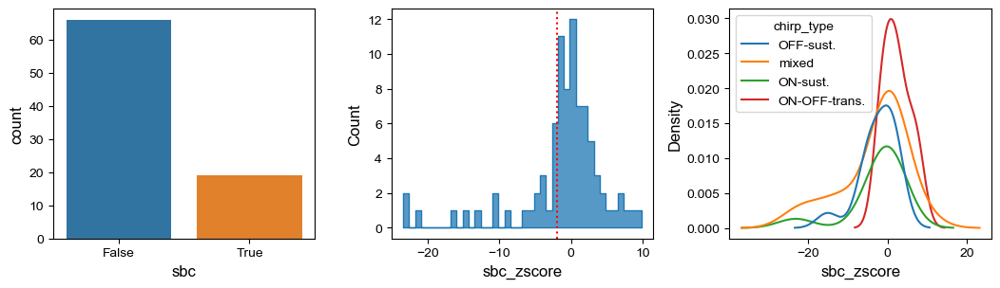

In [16]:
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=cm2inch((27,8)), dpi=100, sharex=False, sharey=False)

print(f'SbC cells: n = {len(udf[udf.sbc==True])}')  # alt: udf.query('sbc==True')
print(f'Other cells: n = {len(udf[udf.sbc==False])}')
print(f'SbC NaN: n = {len(udf[udf.sbc_zscore.isna()])}')

sns.countplot(data=udf, x='sbc', ax=axs[0])
sns.histplot(data=udf, x='sbc_zscore', element='step', bins=40, legend=True, ax=axs[1])
line = axs[1].axvline(-1.96, color='r', linestyle=':', label='SbC z-crit')
plt.legend(handles=[line])
# sns.kdeplot(data=udf, x='sbc_zscore', legend=True, ax=axs[0])
sns.kdeplot(data=udf, x='sbc_zscore', hue='chirp_type', legend=True, ax=axs[2])

fig.tight_layout()

SbC cells: n = 17
Other cells: n = 90


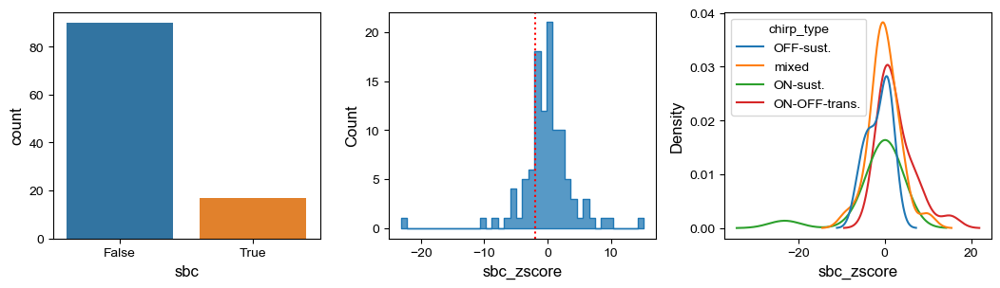

In [185]:
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=cm2inch((27,8)), dpi=100, sharex=False, sharey=False)

print(f'SbC cells: n = {len(udf[udf.sbc==True])}')  # alt: udf.query('sbc==True')
print(f'Other cells: n = {len(udf[udf.sbc==False])}')
print(f'SbC NaN: n = {len(udf[udf.sbc_zscore.isna()])}')

sns.countplot(data=udf, x='sbc', ax=axs[0])
sns.histplot(data=udf, x='sbc_zscore', element='step', bins=40, legend=True, ax=axs[1])
line = axs[1].axvline(-1.96, color='r', linestyle=':', label='SbC z-crit')
plt.legend(handles=[line])
# sns.kdeplot(data=udf, x='sbc_zscore', legend=True, ax=axs[0])
sns.kdeplot(data=udf, x='sbc_zscore', hue='chirp_type', legend=True, ax=axs[2])

fig.tight_layout()

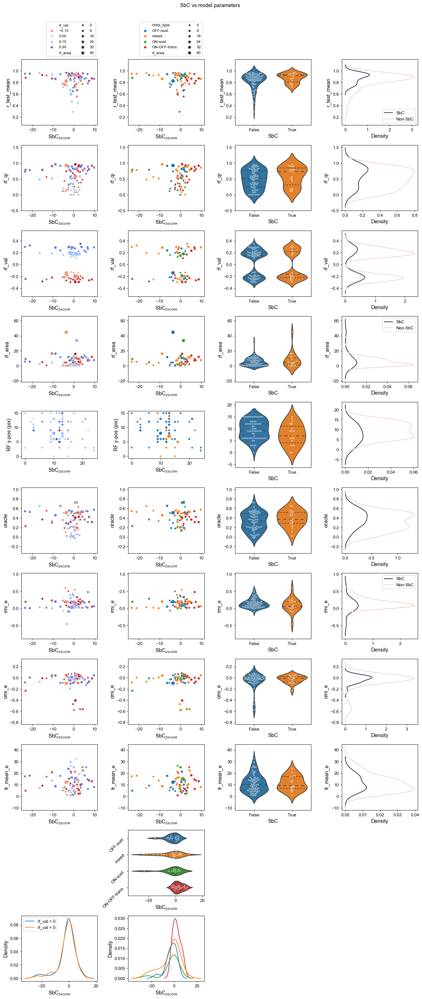

In [17]:
# Plot scatter plot of SbC score vs model
fig, axs = plt.subplots(nrows=11, ncols=4, figsize=cm2inch((35,80)), dpi=110)

for r in range(9):  # sharey axis in every row
    if r != 4:
        axs[r,0].get_shared_y_axes().join(axs[r,0], axs[r,1], axs[r,2], axs[r,3])


# r_test_mean
s = sns.scatterplot(data=udf, x='sbc_zscore', y='r_test_mean', size='rf_area', hue='rf_val', palette='coolwarm_r', legend=True, ax=axs[0,0])
l = s.legend(loc='top left', bbox_to_anchor=[1.0,1.6], ncol=2, fontsize=9, markerscale=0.75)
s = sns.scatterplot(data=udf, x='sbc_zscore', y='r_test_mean', size='rf_area', hue='chirp_type', palette='tab10', legend=True, ax=axs[0,1])
l = s.legend(loc='top left', bbox_to_anchor=[1.0,1.6], ncol=2, fontsize=9, markerscale=0.75)
sns.violinplot(data=udf, x='sbc', y='r_test_mean', inner='quartile', ax=axs[0,2])
sns.swarmplot(data=udf, x='sbc', y='r_test_mean', color='white', edgecolor='gray', alpha=0.5, size=3.5, ax=axs[0,2])
s = sns.kdeplot(data=udf, y='r_test_mean', hue='sbc', ax=axs[0,3])
l = s.legend(labels=['SbC','Non-SbC'])


# RF quality
s = sns.scatterplot(data=udf, x='sbc_zscore', y='rf_qi', size='rf_area', hue='rf_val', palette='coolwarm_r', legend=False, ax=axs[1,0])
s = sns.scatterplot(data=udf, x='sbc_zscore', y='rf_qi', size='rf_area', hue='chirp_type', palette='tab10', legend=False, ax=axs[1,1])
sns.violinplot(data=udf, x='sbc', y='rf_qi', inner='quartile', ax=axs[1,2])
sns.swarmplot(data=udf, x='sbc', y='rf_qi', color='white', edgecolor='gray', alpha=0.5, size=3.5, ax=axs[1,2])
s = sns.kdeplot(data=udf, y='rf_qi', hue='sbc', legend=False, ax=axs[1,3])


# RF val
s = sns.scatterplot(data=udf, x='sbc_zscore', y='rf_val', size='rf_area', hue='rf_val', palette='coolwarm_r', legend=False, ax=axs[2,0])
s = sns.scatterplot(data=udf, x='sbc_zscore', y='rf_val', size='rf_area', hue='chirp_type', palette='tab10', legend=False, ax=axs[2,1])
sns.violinplot(data=udf, x='sbc', y='rf_val', inner='quartile', bw=0.2, ax=axs[2,2])
sns.swarmplot(data=udf, x='sbc', y='rf_val', color='white', edgecolor='gray', alpha=0.5, size=3.5, ax=axs[2,2])
s = sns.kdeplot(data=udf, y='rf_val', hue='sbc', legend=False, bw_adjust=0.5, ax=axs[2,3])

# RF area
s = sns.scatterplot(data=udf, x='sbc_zscore', y='rf_area', size='rf_area', hue='rf_val', palette='coolwarm_r', legend=False, ax=axs[3,0])
s = sns.scatterplot(data=udf, x='sbc_zscore', y='rf_area', size='rf_area', hue='chirp_type', palette='tab10', legend=False, ax=axs[3,1])
sns.violinplot(data=udf, x='sbc', y='rf_area', inner='quartile', ax=axs[3,2])
sns.swarmplot(data=udf, x='sbc', y='rf_area', color='white', edgecolor='gray', alpha=0.5, size=3.5, ax=axs[3,2])
s = sns.kdeplot(data=udf, y='rf_area', hue='sbc', legend=False, ax=axs[3,3])
l = s.legend(labels=['SbC','Non-SbC'])


# RF position
x_pos = np.array([x for x,y in udf.rf_pos_pix.values])
y_pos = np.array([y for x,y in udf.rf_pos_pix.values])
s = sns.scatterplot(data=udf, x=x_pos, y=y_pos, size='rf_area', hue='sbc_zscore',  palette='coolwarm_r', legend=False, ax=axs[4,0])  # crest, rocket_r
axs[4,0].set_xlabel('RF x-pos (pix)')
axs[4,0].set_ylabel('RF y-pos (pix)')
axs[4,0].set_aspect('equal')
s = sns.scatterplot(data=udf, x=x_pos, y=y_pos, size='rf_area', hue='sbc', palette='tab10', legend=False, ax=axs[4,1])
axs[4,1].set_xlabel('RF x-pos (pix)')
axs[4,1].set_ylabel('RF y-pos (pix)')
axs[4,1].set_aspect('equal')
sns.violinplot(data=udf, x='sbc', y=y_pos, inner='quartile', ax=axs[4,2])
sns.swarmplot(data=udf, x='sbc', y=y_pos, color='white', edgecolor='gray', alpha=0.5, size=3.5, ax=axs[4,2])
sns.kdeplot(data=udf, y=y_pos, hue='sbc', legend=False, ax=axs[4,3])


# oracle
s = sns.scatterplot(data=udf, x='sbc_zscore', y='oracle', size='rf_area', hue='rf_val', palette='coolwarm_r', legend=False, ax=axs[5,0])
s = sns.scatterplot(data=udf, x='sbc_zscore', y='oracle', size='rf_area', hue='chirp_type', palette='tab10', legend=False, ax=axs[5,1])
sns.violinplot(data=udf, x='sbc', y='oracle', inner='quartile', ax=axs[5,2])
sns.swarmplot(data=udf, x='sbc', y='oracle', color='white', edgecolor='gray', alpha=0.5, size=3.5, ax=axs[5,2])
s = sns.kdeplot(data=udf, y='oracle', hue='sbc', legend=False, ax=axs[5,3])


# RMI
s = sns.scatterplot(data=udf, x='sbc_zscore', y='rmi_e', size='rf_area', hue='rf_val', palette='coolwarm_r', legend=False, ax=axs[6,0])
s = sns.scatterplot(data=udf, x='sbc_zscore', y='rmi_e', size='rf_area', hue='chirp_type', palette='tab10', legend=False, ax=axs[6,1])
sns.violinplot(data=udf, x='sbc', y='rmi_e', inner='quartile', ax=axs[6,2])
sns.swarmplot(data=udf, x='sbc', y='rmi_e', color='white', edgecolor='gray', alpha=0.5, size=3.5, ax=axs[6,2])
s = sns.kdeplot(data=udf, y='rmi_e', hue='sbc', legend=False, ax=axs[6,3])
l = s.legend(labels=['SbC','Non-SbC'])

# OMI
s = sns.scatterplot(data=udf, x='sbc_zscore', y='omi_e', size='rf_area', hue='rf_val', palette='coolwarm_r', legend=False, ax=axs[7,0])
s = sns.scatterplot(data=udf, x='sbc_zscore', y='omi_e', size='rf_area', hue='chirp_type', palette='tab10', legend=False, ax=axs[7,1])
sns.violinplot(data=udf, x='sbc', y='omi_e', inner='quartile', ax=axs[7,2])
sns.swarmplot(data=udf, x='sbc', y='omi_e', color='white', edgecolor='gray', alpha=0.5, size=3.5, ax=axs[7,2])
s = sns.kdeplot(data=udf, y='omi_e', hue='sbc', legend=False, ax=axs[7,3])


# mean FR
s = sns.scatterplot(data=udf, x='sbc_zscore', y='fr_mean_e', size='rf_area', hue='rf_val', palette='coolwarm_r', legend=False, ax=axs[8,0])
s = sns.scatterplot(data=udf, x='sbc_zscore', y='fr_mean_e', size='rf_area', hue='chirp_type', palette='tab10', legend=False, ax=axs[8,1])
sns.violinplot(data=udf, x='sbc', y='fr_mean_e', inner='quartile', ax=axs[8,2])
sns.swarmplot(data=udf, x='sbc', y='fr_mean_e', color='white', edgecolor='gray', alpha=0.5, size=3.5, ax=axs[8,2])
s = sns.kdeplot(data=udf, y='fr_mean_e', hue='sbc', legend=False, ax=axs[8,3])


# Bottom marginal plots
sns.kdeplot(data=udf[udf.rf_val > 0], x='sbc_zscore', legend=True, label='rf_val > 0', ax=axs[10,0])
s = sns.kdeplot(data=udf[udf.rf_val < 0], x='sbc_zscore', legend=True, label='rf_val < 0', ax=axs[10,0])
s.legend()

sns.violinplot(data=udf, x='sbc_zscore', y='chirp_type', inner='quartile', ax=axs[9,1])
sns.swarmplot(data=udf, x='sbc_zscore', y='chirp_type', color='white', edgecolor='gray', alpha=0.5, size=3.5, ax=axs[9,1])
sns.kdeplot(data=udf, x='sbc_zscore', hue='chirp_type', legend=False, ax=axs[10,1])
axs[9,1].set_ylabel('')
plt.setp(axs[9,1].get_yticklabels(), rotation=45)

for ax in axs[:,0]: ax.set_xlabel(r'SbC$_{zscore}$')
for ax in axs[:,1]: ax.set_xlabel(r'SbC$_{zscore}$')
for ax in axs[:,2]: ax.set_xlabel('SbC')

axs[9,0].set_visible(False)
axs[9,2].set_visible(False)
axs[9,3].set_visible(False)
axs[10,2].set_visible(False)
axs[10,3].set_visible(False)

fig.suptitle('SbC vs model parameters', y=1.02)
fig.tight_layout()

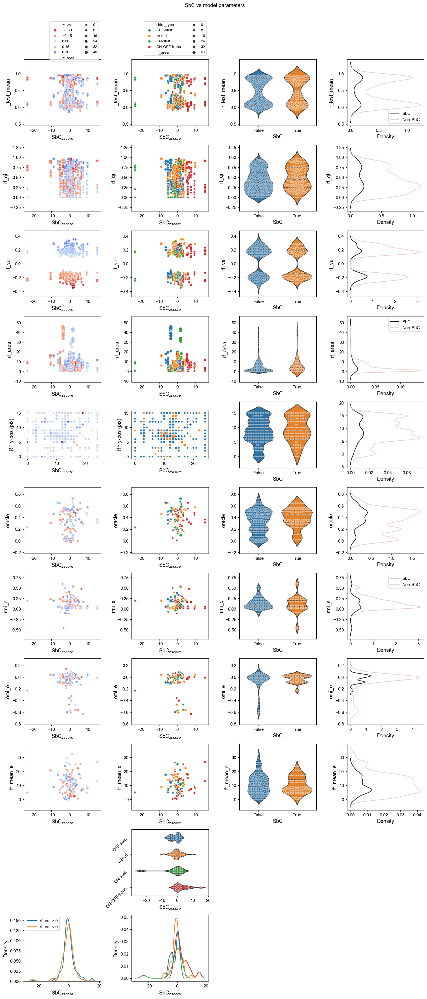

In [22]:
# Plot scatter plot of SbC score vs model
fig, axs = plt.subplots(nrows=11, ncols=4, figsize=cm2inch((35,80)), dpi=110)

for r in range(9):  # sharey axis in every row
    if r != 4:
        axs[r,0].get_shared_y_axes().join(axs[r,0], axs[r,1], axs[r,2], axs[r,3])


# r_test_mean
s = sns.scatterplot(data=udf, x='sbc_zscore', y='r_test_mean', size='rf_area', hue='rf_val', palette='coolwarm_r', legend=True, ax=axs[0,0])
l = s.legend(loc='top left', bbox_to_anchor=[1.0,1.6], ncol=2, fontsize=9, markerscale=0.75)
s = sns.scatterplot(data=udf, x='sbc_zscore', y='r_test_mean', size='rf_area', hue='chirp_type', palette='tab10', legend=True, ax=axs[0,1])
l = s.legend(loc='top left', bbox_to_anchor=[1.0,1.6], ncol=2, fontsize=9, markerscale=0.75)
sns.violinplot(data=udf, x='sbc', y='r_test_mean', inner='quartile', ax=axs[0,2])
sns.swarmplot(data=udf, x='sbc', y='r_test_mean', color='white', edgecolor='gray', alpha=0.5, size=3.5, ax=axs[0,2])
s = sns.kdeplot(data=udf, y='r_test_mean', hue='sbc', ax=axs[0,3])
l = s.legend(labels=['SbC','Non-SbC'])


# RF quality
s = sns.scatterplot(data=udf, x='sbc_zscore', y='rf_qi', size='rf_area', hue='rf_val', palette='coolwarm_r', legend=False, ax=axs[1,0])
s = sns.scatterplot(data=udf, x='sbc_zscore', y='rf_qi', size='rf_area', hue='chirp_type', palette='tab10', legend=False, ax=axs[1,1])
sns.violinplot(data=udf, x='sbc', y='rf_qi', inner='quartile', ax=axs[1,2])
sns.swarmplot(data=udf, x='sbc', y='rf_qi', color='white', edgecolor='gray', alpha=0.5, size=3.5, ax=axs[1,2])
s = sns.kdeplot(data=udf, y='rf_qi', hue='sbc', legend=False, ax=axs[1,3])


# RF val
s = sns.scatterplot(data=udf, x='sbc_zscore', y='rf_val', size='rf_area', hue='rf_val', palette='coolwarm_r', legend=False, ax=axs[2,0])
s = sns.scatterplot(data=udf, x='sbc_zscore', y='rf_val', size='rf_area', hue='chirp_type', palette='tab10', legend=False, ax=axs[2,1])
sns.violinplot(data=udf, x='sbc', y='rf_val', inner='quartile', bw=0.2, ax=axs[2,2])
sns.swarmplot(data=udf, x='sbc', y='rf_val', color='white', edgecolor='gray', alpha=0.5, size=3.5, ax=axs[2,2])
s = sns.kdeplot(data=udf, y='rf_val', hue='sbc', legend=False, bw_adjust=0.5, ax=axs[2,3])

# RF area
s = sns.scatterplot(data=udf, x='sbc_zscore', y='rf_area', size='rf_area', hue='rf_val', palette='coolwarm_r', legend=False, ax=axs[3,0])
s = sns.scatterplot(data=udf, x='sbc_zscore', y='rf_area', size='rf_area', hue='chirp_type', palette='tab10', legend=False, ax=axs[3,1])
sns.violinplot(data=udf, x='sbc', y='rf_area', inner='quartile', ax=axs[3,2])
sns.swarmplot(data=udf, x='sbc', y='rf_area', color='white', edgecolor='gray', alpha=0.5, size=3.5, ax=axs[3,2])
s = sns.kdeplot(data=udf, y='rf_area', hue='sbc', legend=False, ax=axs[3,3])
l = s.legend(labels=['SbC','Non-SbC'])


# RF position
x_pos = np.array([x for x,y in udf.rf_pos_pix.values])
y_pos = np.array([y for x,y in udf.rf_pos_pix.values])
s = sns.scatterplot(data=udf, x=x_pos, y=y_pos, size='rf_area', hue='sbc_zscore',  palette='coolwarm_r', legend=False, ax=axs[4,0])  # crest, rocket_r
axs[4,0].set_xlabel('RF x-pos (pix)')
axs[4,0].set_ylabel('RF y-pos (pix)')
axs[4,0].set_aspect('equal')
s = sns.scatterplot(data=udf, x=x_pos, y=y_pos, size='rf_area', hue='sbc', palette='tab10', legend=False, ax=axs[4,1])
axs[4,1].set_xlabel('RF x-pos (pix)')
axs[4,1].set_ylabel('RF y-pos (pix)')
axs[4,1].set_aspect('equal')
sns.violinplot(data=udf, x='sbc', y=y_pos, inner='quartile', ax=axs[4,2])
sns.swarmplot(data=udf, x='sbc', y=y_pos, color='white', edgecolor='gray', alpha=0.5, size=3.5, ax=axs[4,2])
sns.kdeplot(data=udf, y=y_pos, hue='sbc', legend=False, ax=axs[4,3])


# oracle
s = sns.scatterplot(data=udf, x='sbc_zscore', y='oracle', size='rf_area', hue='rf_val', palette='coolwarm_r', legend=False, ax=axs[5,0])
s = sns.scatterplot(data=udf, x='sbc_zscore', y='oracle', size='rf_area', hue='chirp_type', palette='tab10', legend=False, ax=axs[5,1])
sns.violinplot(data=udf, x='sbc', y='oracle', inner='quartile', ax=axs[5,2])
sns.swarmplot(data=udf, x='sbc', y='oracle', color='white', edgecolor='gray', alpha=0.5, size=3.5, ax=axs[5,2])
s = sns.kdeplot(data=udf, y='oracle', hue='sbc', legend=False, ax=axs[5,3])


# RMI
s = sns.scatterplot(data=udf, x='sbc_zscore', y='rmi_e', size='rf_area', hue='rf_val', palette='coolwarm_r', legend=False, ax=axs[6,0])
s = sns.scatterplot(data=udf, x='sbc_zscore', y='rmi_e', size='rf_area', hue='chirp_type', palette='tab10', legend=False, ax=axs[6,1])
sns.violinplot(data=udf, x='sbc', y='rmi_e', inner='quartile', ax=axs[6,2])
sns.swarmplot(data=udf, x='sbc', y='rmi_e', color='white', edgecolor='gray', alpha=0.5, size=3.5, ax=axs[6,2])
s = sns.kdeplot(data=udf, y='rmi_e', hue='sbc', legend=False, ax=axs[6,3])
l = s.legend(labels=['SbC','Non-SbC'])

# OMI
s = sns.scatterplot(data=udf, x='sbc_zscore', y='omi_e', size='rf_area', hue='rf_val', palette='coolwarm_r', legend=False, ax=axs[7,0])
s = sns.scatterplot(data=udf, x='sbc_zscore', y='omi_e', size='rf_area', hue='chirp_type', palette='tab10', legend=False, ax=axs[7,1])
sns.violinplot(data=udf, x='sbc', y='omi_e', inner='quartile', ax=axs[7,2])
sns.swarmplot(data=udf, x='sbc', y='omi_e', color='white', edgecolor='gray', alpha=0.5, size=3.5, ax=axs[7,2])
s = sns.kdeplot(data=udf, y='omi_e', hue='sbc', legend=False, ax=axs[7,3])


# mean FR
s = sns.scatterplot(data=udf, x='sbc_zscore', y='fr_mean_e', size='rf_area', hue='rf_val', palette='coolwarm_r', legend=False, ax=axs[8,0])
s = sns.scatterplot(data=udf, x='sbc_zscore', y='fr_mean_e', size='rf_area', hue='chirp_type', palette='tab10', legend=False, ax=axs[8,1])
sns.violinplot(data=udf, x='sbc', y='fr_mean_e', inner='quartile', ax=axs[8,2])
sns.swarmplot(data=udf, x='sbc', y='fr_mean_e', color='white', edgecolor='gray', alpha=0.5, size=3.5, ax=axs[8,2])
s = sns.kdeplot(data=udf, y='fr_mean_e', hue='sbc', legend=False, ax=axs[8,3])


# Bottom marginal plots
sns.kdeplot(data=udf[udf.rf_val > 0], x='sbc_zscore', legend=True, label='rf_val > 0', ax=axs[10,0])
s = sns.kdeplot(data=udf[udf.rf_val < 0], x='sbc_zscore', legend=True, label='rf_val < 0', ax=axs[10,0])
s.legend()

sns.violinplot(data=udf, x='sbc_zscore', y='chirp_type', inner='quartile', ax=axs[9,1])
sns.swarmplot(data=udf, x='sbc_zscore', y='chirp_type', color='white', edgecolor='gray', alpha=0.5, size=3.5, ax=axs[9,1])
sns.kdeplot(data=udf, x='sbc_zscore', hue='chirp_type', legend=False, ax=axs[10,1])
axs[9,1].set_ylabel('')
plt.setp(axs[9,1].get_yticklabels(), rotation=45)

for ax in axs[:,0]: ax.set_xlabel(r'SbC$_{zscore}$')
for ax in axs[:,1]: ax.set_xlabel(r'SbC$_{zscore}$')
for ax in axs[:,2]: ax.set_xlabel('SbC')

axs[9,0].set_visible(False)
axs[9,2].set_visible(False)
axs[9,3].set_visible(False)
axs[10,2].set_visible(False)
axs[10,3].set_visible(False)

fig.suptitle('SbC vs model parameters', y=1.02)
fig.tight_layout()

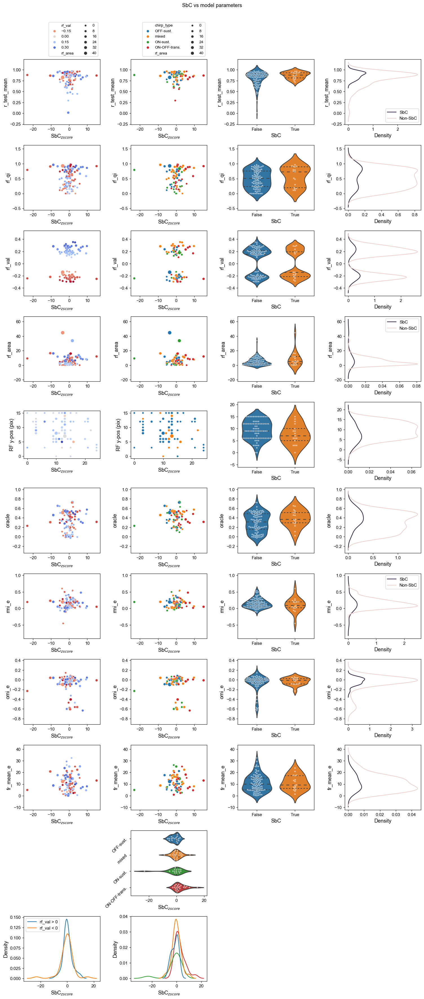

In [48]:
# Plot scatter plot of SbC score vs model
fig, axs = plt.subplots(nrows=11, ncols=4, figsize=cm2inch((35,80)), dpi=110)

for r in range(9):  # sharey axis in every row
    if r != 4:
        axs[r,0].get_shared_y_axes().join(axs[r,0], axs[r,1], axs[r,2], axs[r,3])


# r_test_mean
s = sns.scatterplot(data=udf, x='sbc_zscore', y='r_test_mean', size='rf_area', hue='rf_val', palette='coolwarm_r', legend=True, ax=axs[0,0])
l = s.legend(loc='top left', bbox_to_anchor=[1.0,1.6], ncol=2, fontsize=9, markerscale=0.75)
s = sns.scatterplot(data=udf, x='sbc_zscore', y='r_test_mean', size='rf_area', hue='chirp_type', palette='tab10', legend=True, ax=axs[0,1])
l = s.legend(loc='top left', bbox_to_anchor=[1.0,1.6], ncol=2, fontsize=9, markerscale=0.75)
sns.violinplot(data=udf, x='sbc', y='r_test_mean', inner='quartile', ax=axs[0,2])
sns.swarmplot(data=udf, x='sbc', y='r_test_mean', color='white', edgecolor='gray', alpha=0.5, size=3.5, ax=axs[0,2])
s = sns.kdeplot(data=udf, y='r_test_mean', hue='sbc', ax=axs[0,3])
l = s.legend(labels=['SbC','Non-SbC'])


# RF quality
s = sns.scatterplot(data=udf, x='sbc_zscore', y='rf_qi', size='rf_area', hue='rf_val', palette='coolwarm_r', legend=False, ax=axs[1,0])
s = sns.scatterplot(data=udf, x='sbc_zscore', y='rf_qi', size='rf_area', hue='chirp_type', palette='tab10', legend=False, ax=axs[1,1])
sns.violinplot(data=udf, x='sbc', y='rf_qi', inner='quartile', ax=axs[1,2])
sns.swarmplot(data=udf, x='sbc', y='rf_qi', color='white', edgecolor='gray', alpha=0.5, size=3.5, ax=axs[1,2])
s = sns.kdeplot(data=udf, y='rf_qi', hue='sbc', legend=False, ax=axs[1,3])


# RF val
s = sns.scatterplot(data=udf, x='sbc_zscore', y='rf_val', size='rf_area', hue='rf_val', palette='coolwarm_r', legend=False, ax=axs[2,0])
s = sns.scatterplot(data=udf, x='sbc_zscore', y='rf_val', size='rf_area', hue='chirp_type', palette='tab10', legend=False, ax=axs[2,1])
sns.violinplot(data=udf, x='sbc', y='rf_val', inner='quartile', bw=0.2, ax=axs[2,2])
sns.swarmplot(data=udf, x='sbc', y='rf_val', color='white', edgecolor='gray', alpha=0.5, size=3.5, ax=axs[2,2])
s = sns.kdeplot(data=udf, y='rf_val', hue='sbc', legend=False, bw_adjust=0.5, ax=axs[2,3])

# RF area
s = sns.scatterplot(data=udf, x='sbc_zscore', y='rf_area', size='rf_area', hue='rf_val', palette='coolwarm_r', legend=False, ax=axs[3,0])
s = sns.scatterplot(data=udf, x='sbc_zscore', y='rf_area', size='rf_area', hue='chirp_type', palette='tab10', legend=False, ax=axs[3,1])
sns.violinplot(data=udf, x='sbc', y='rf_area', inner='quartile', ax=axs[3,2])
sns.swarmplot(data=udf, x='sbc', y='rf_area', color='white', edgecolor='gray', alpha=0.5, size=3.5, ax=axs[3,2])
s = sns.kdeplot(data=udf, y='rf_area', hue='sbc', legend=False, ax=axs[3,3])
l = s.legend(labels=['SbC','Non-SbC'])


# RF position
x_pos = np.array([x for x,y in udf.rf_pos_pix.values])
y_pos = np.array([y for x,y in udf.rf_pos_pix.values])
s = sns.scatterplot(data=udf, x=x_pos, y=y_pos, size='rf_area', hue='sbc_zscore',  palette='coolwarm_r', legend=False, ax=axs[4,0])  # crest, rocket_r
axs[4,0].set_xlabel('RF x-pos (pix)')
axs[4,0].set_ylabel('RF y-pos (pix)')
axs[4,0].set_aspect('equal')
s = sns.scatterplot(data=udf, x=x_pos, y=y_pos, size='rf_area', hue='sbc', palette='tab10', legend=False, ax=axs[4,1])
axs[4,1].set_xlabel('RF x-pos (pix)')
axs[4,1].set_ylabel('RF y-pos (pix)')
axs[4,1].set_aspect('equal')
sns.violinplot(data=udf, x='sbc', y=y_pos, inner='quartile', ax=axs[4,2])
sns.swarmplot(data=udf, x='sbc', y=y_pos, color='white', edgecolor='gray', alpha=0.5, size=3.5, ax=axs[4,2])
sns.kdeplot(data=udf, y=y_pos, hue='sbc', legend=False, ax=axs[4,3])


# oracle
s = sns.scatterplot(data=udf, x='sbc_zscore', y='oracle', size='rf_area', hue='rf_val', palette='coolwarm_r', legend=False, ax=axs[5,0])
s = sns.scatterplot(data=udf, x='sbc_zscore', y='oracle', size='rf_area', hue='chirp_type', palette='tab10', legend=False, ax=axs[5,1])
sns.violinplot(data=udf, x='sbc', y='oracle', inner='quartile', ax=axs[5,2])
sns.swarmplot(data=udf, x='sbc', y='oracle', color='white', edgecolor='gray', alpha=0.5, size=3.5, ax=axs[5,2])
s = sns.kdeplot(data=udf, y='oracle', hue='sbc', legend=False, ax=axs[5,3])


# RMI
s = sns.scatterplot(data=udf, x='sbc_zscore', y='rmi_e', size='rf_area', hue='rf_val', palette='coolwarm_r', legend=False, ax=axs[6,0])
s = sns.scatterplot(data=udf, x='sbc_zscore', y='rmi_e', size='rf_area', hue='chirp_type', palette='tab10', legend=False, ax=axs[6,1])
sns.violinplot(data=udf, x='sbc', y='rmi_e', inner='quartile', ax=axs[6,2])
sns.swarmplot(data=udf, x='sbc', y='rmi_e', color='white', edgecolor='gray', alpha=0.5, size=3.5, ax=axs[6,2])
s = sns.kdeplot(data=udf, y='rmi_e', hue='sbc', legend=False, ax=axs[6,3])
l = s.legend(labels=['SbC','Non-SbC'])

# OMI
s = sns.scatterplot(data=udf, x='sbc_zscore', y='omi_e', size='rf_area', hue='rf_val', palette='coolwarm_r', legend=False, ax=axs[7,0])
s = sns.scatterplot(data=udf, x='sbc_zscore', y='omi_e', size='rf_area', hue='chirp_type', palette='tab10', legend=False, ax=axs[7,1])
sns.violinplot(data=udf, x='sbc', y='omi_e', inner='quartile', ax=axs[7,2])
sns.swarmplot(data=udf, x='sbc', y='omi_e', color='white', edgecolor='gray', alpha=0.5, size=3.5, ax=axs[7,2])
s = sns.kdeplot(data=udf, y='omi_e', hue='sbc', legend=False, ax=axs[7,3])


# mean FR
s = sns.scatterplot(data=udf, x='sbc_zscore', y='fr_mean_e', size='rf_area', hue='rf_val', palette='coolwarm_r', legend=False, ax=axs[8,0])
s = sns.scatterplot(data=udf, x='sbc_zscore', y='fr_mean_e', size='rf_area', hue='chirp_type', palette='tab10', legend=False, ax=axs[8,1])
sns.violinplot(data=udf, x='sbc', y='fr_mean_e', inner='quartile', ax=axs[8,2])
sns.swarmplot(data=udf, x='sbc', y='fr_mean_e', color='white', edgecolor='gray', alpha=0.5, size=3.5, ax=axs[8,2])
s = sns.kdeplot(data=udf, y='fr_mean_e', hue='sbc', legend=False, ax=axs[8,3])


# Bottom marginal plots
sns.kdeplot(data=udf[udf.rf_val > 0], x='sbc_zscore', legend=True, label='rf_val > 0', ax=axs[10,0])
s = sns.kdeplot(data=udf[udf.rf_val < 0], x='sbc_zscore', legend=True, label='rf_val < 0', ax=axs[10,0])
s.legend()

sns.violinplot(data=udf, x='sbc_zscore', y='chirp_type', inner='quartile', ax=axs[9,1])
sns.swarmplot(data=udf, x='sbc_zscore', y='chirp_type', color='white', edgecolor='gray', alpha=0.5, size=3.5, ax=axs[9,1])
sns.kdeplot(data=udf, x='sbc_zscore', hue='chirp_type', legend=False, ax=axs[10,1])
axs[9,1].set_ylabel('')
plt.setp(axs[9,1].get_yticklabels(), rotation=45)

for ax in axs[:,0]: ax.set_xlabel(r'SbC$_{zscore}$')
for ax in axs[:,1]: ax.set_xlabel(r'SbC$_{zscore}$')
for ax in axs[:,2]: ax.set_xlabel('SbC')

axs[9,0].set_visible(False)
axs[9,2].set_visible(False)
axs[9,3].set_visible(False)
axs[10,2].set_visible(False)
axs[10,3].set_visible(False)

fig.suptitle('SbC vs model parameters', y=1.02)
fig.tight_layout()

### OLD FIGURES (temporary, for comparison)

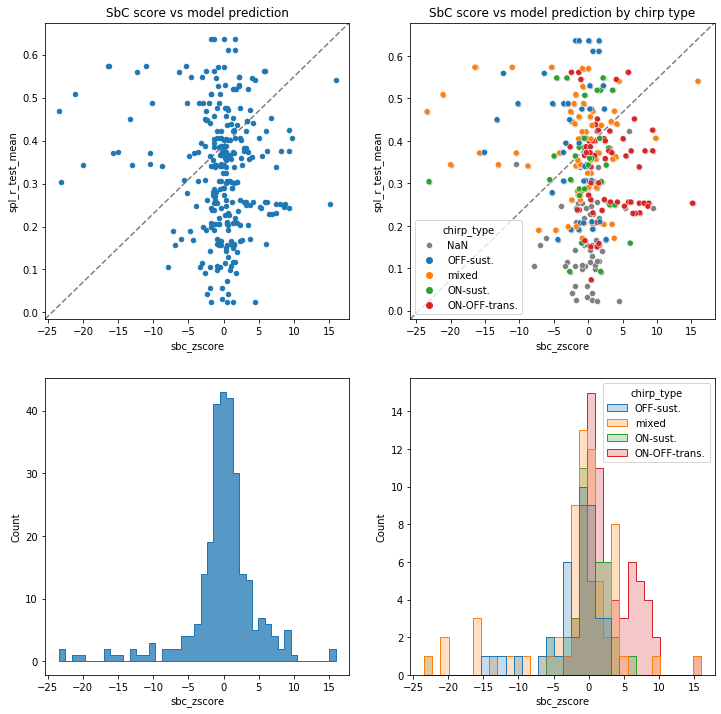

In [204]:
# Plot scatter plot of SbC score vs model prediction (and chirp type)
fig, axs = plt.subplots(2,2, figsize=(12,12))

df.plot.scatter(x='sbc_zscore', y='spl_r_test_mean', ax=axs[0,0]);
axs[0,0].plot([0, 1], [0, 1], color='grey', linestyle='--', transform=axs[0,0].transAxes, zorder=-1)
axs[0,0].set_title('SbC score vs model prediction')

sns.scatterplot(data=df, x='sbc_zscore', y='spl_r_test_mean', ax=axs[0,1], color='grey', label='NaN')
sns.scatterplot(data=df, x='sbc_zscore', y='spl_r_test_mean', hue='chirp_type', ax=axs[0,1])
axs[0,1].plot([0, 1], [0, 1], color='grey', linestyle='--', transform=axs[0,1].transAxes, zorder=-1)
axs[0,1].set_title('SbC score vs model prediction by chirp type')

sns.histplot(data=df, x='sbc_zscore', element='step', ax=axs[1,0])#, bins=40)
# sns.histplot(data=df[(df.chirp_type=='ON-sust.') | (df.chirp_type=='OFF-sust.')],
#              x='sbc_zscore', hue='chirp_type', element='step', ax=axs[1,1])#, bins=40)
sns.histplot(data=df, x='sbc_zscore', hue='chirp_type', element='step', ax=axs[1,1])#, bins=40)
# sns.kdeplot(data=df, x='sbc_zscore', hue='chirp_type', ax=axs[1,1])#, bins=40)

/Users/ybauer/miniconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x[:, None]
/Users/ybauer/miniconda3/lib/python3.7/site-packages/matplotlib/axes/_base.py:276: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]
/Users/ybauer/miniconda3/lib/python3.7/site-packages/matplotlib/axes/_base.py:278: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  y = y[:, np.newaxis]
/Users/ybauer/miniconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1402: FutureWarning: Support for multi-dimensional indexing

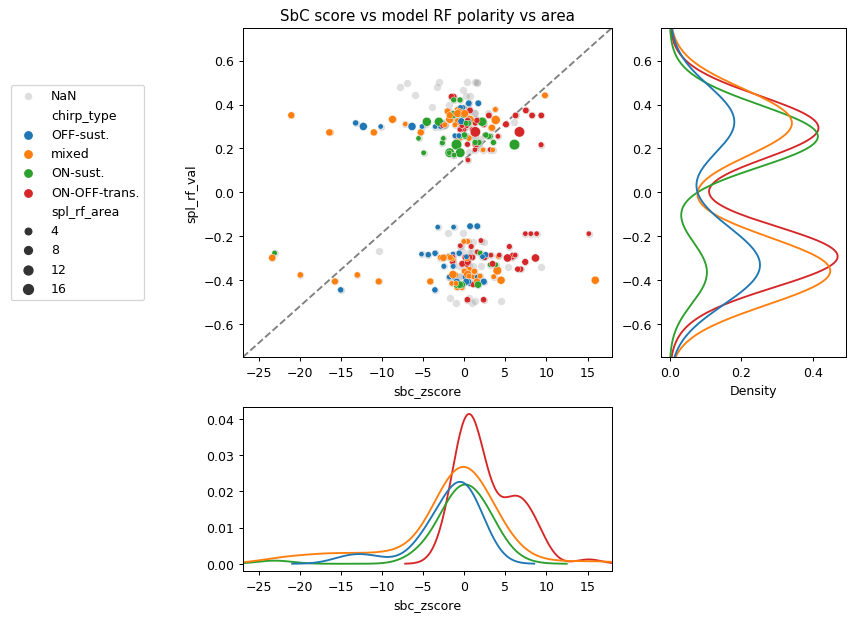

In [236]:
# Plot scatter plot of SbC score vs area
fig, axs = plt.subplots(2,3, figsize=(12,8), dpi=90, sharey=False, gridspec_kw={'width_ratios': [0.5, 1, 0.5], 'height_ratios': [1, 0.5]})
# plt.subplots_adjust(wspace=1)

axs[0,0].set_axis_off()

sns.scatterplot(data=df, x='sbc_zscore', y='spl_rf_val', color='grey', label='NaN', alpha=0.25, ax=axs[0,1])
sns.scatterplot(data=df, x='sbc_zscore', y='spl_rf_val', size='spl_rf_area', hue='chirp_type', ax=axs[0,1])
axs[0,1].plot([0, 1], [0, 1], color='grey', linestyle='--', transform=axs[0,1].transAxes, zorder=-1)
axs[0,1].set_title('SbC score vs model RF polarity vs area');
axs[0,1].legend(loc='center right', bbox_to_anchor=(-0.25, 0.5), ncol=1)
axs[0,1].set_ylim([-0.75, 0.75])
axs[0,1].set_xlim([-27, 18])

# sns.histplot(data=df, y='spl_rf_val', hue='chirp_type', element='step', ax=axs[2])#, bins=40)
sns.kdeplot(data=df, y='spl_rf_val', hue='chirp_type', fill=False, alpha=1, ax=axs[0,2])#, bins=40)
axs[0,2].legend([],[], frameon=False)
axs[0,2].set_ylabel('')
axs[0,2].set_ylim([-0.75, 0.75])
# plt.tight_layout()

axs[1,0].set_axis_off()

sns.kdeplot(data=df, x='sbc_zscore', hue='chirp_type', ax=axs[1,1])#, bins=40)
axs[1,1].set_xlim([-27, 18])
axs[1,1].set_ylabel('')
axs[1,1].legend([],[], frameon=False)

axs[1,2].set_axis_off()

# Unit info clustering?

In [123]:
# Check how many full-featured units we have
udf.dropna()  # 10/6/21: 78 rows

,m,s,u,chirp_type,osi_ctrl,osi_opto,dsi_ctrl,dsi_opto,sbc_zscore,sbc,...,r_test_repeats,r2_train,r2_test_mean,r2_test_repeats,fev,rf_qi,rf_thresh,rf_area,rf_pos_pix,rf_val
3,Ntsr1Cre_2019_0007,6,7,OFF-sust.,0.170548,0.163939,0.240574,0.273867,-5.231121,True,...,"[0.788012363088473, 0.8142464619398074, 0.7815...",0.577618,0.523745,"[0.5091778408887211, 0.5733509819500541, 0.503...",3.01890,1.133030e-01,-0.190000,0.50,"[15, 3]",-0.214278
4,Ntsr1Cre_2019_0007,6,8,mixed,0.034076,0.044401,0.039928,0.136595,3.809160,False,...,"[0.9311412536966458, 0.9045253196704028, 0.913...",0.775568,0.734190,"[0.777773954904236, 0.7631627236526632, 0.7596...",2.30337,9.324090e-01,0.020000,11.75,"[15, 6]",0.295899
7,Ntsr1Cre_2019_0007,6,11,mixed,0.092091,0.156302,0.047044,0.175264,-8.764998,True,...,"[0.8957148837506175, 0.9001784581709592, 0.886...",0.678524,0.629601,"[0.6726316928368683, 0.6870638934206693, 0.659...",2.74148,9.648030e-01,0.010000,16.25,"[12, 10]",0.284113
16,Ntsr1Cre_2019_0007,6,13,mixed,0.052542,0.058214,0.062262,0.128273,0.545487,False,...,"[0.6953971438811256, 0.6912023975061213, 0.704...",0.479206,0.415135,"[0.37252985151389506, 0.37556461100615757, 0.3...",8.24864,5.104010e-01,-0.130000,3.00,"[9, 6]",-0.265523
17,Ntsr1Cre_2019_0007,6,15,ON-sust.,0.071644,0.109689,0.256866,0.343084,1.814510,False,...,"[0.5910770884216598, 0.6156830753279025, 0.617...",0.544389,0.314203,"[0.31743888535618303, 0.3351815391257217, 0.34...",-25.72620,1.296660e-01,0.180000,0.75,"[12, 12]",0.206817
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
112,Ntsr1Cre_2020_0002,6,18,ON-OFF-trans.,0.082011,0.088137,0.172538,0.089501,1.329635,False,...,"[0.9356334401910571, 0.9286936631593123, 0.933...",0.772325,0.759391,"[0.7323937165287862, 0.7438310531063119, 0.736...",2.15977,7.569910e-01,0.070000,7.00,"[12, 12]",0.288055
113,Ntsr1Cre_2020_0002,6,23,OFF-sust.,0.027500,0.055030,0.057014,0.063878,-6.386582,True,...,"[0.9434346276282944, 0.9522524783803147, 0.952...",0.866030,0.838387,"[0.8350113740459005, 0.8542101930785834, 0.857...",1.78775,9.150410e-01,0.020000,11.75,"[13, 14]",0.235407
114,Ntsr1Cre_2020_0002,6,26,mixed,0.140007,0.170701,0.387567,0.445416,0.403691,False,...,"[0.7973928316171909, 0.8201549175781938, 0.826...",0.564088,0.548888,"[0.4900612090634673, 0.539433508211355, 0.5736...",3.02154,2.579910e-01,-0.160000,0.75,"[11, 15]",-0.215631
115,Ntsr1Cre_2020_0002,6,27,ON-sust.,0.061781,0.086916,0.031401,0.022410,-0.001818,False,...,"[0.8422647409662433, 0.8596582645240747, 0.848...",0.667590,0.633812,"[0.6133107824991172, 0.6465766102252328, 0.624...",7.69264,7.426790e-10,-0.134648,0.25,"[9, 12]",-0.134648


In [125]:
unit_info_df.dropna()

,m,s,u,chirp_type,osi_ctrl,osi_opto,dsi_ctrl,dsi_opto,sbc_zscore,sbc,wave_type
0,Ntsr1Cre_2019_0002,3,13,ON-sust.,0.058347,0.015818,0.003239,0.081268,8.678365,False,excit
1,Ntsr1Cre_2019_0002,3,14,ON-OFF-trans.,0.019194,0.067131,0.093939,0.070952,4.316509,False,excit
2,Ntsr1Cre_2019_0002,3,19,mixed,0.132265,0.150986,0.242817,0.033709,0.068580,False,excit
3,Ntsr1Cre_2019_0002,3,30,ON-OFF-trans.,0.122563,0.020055,0.086487,0.127151,1.423739,False,excit
5,Ntsr1Cre_2019_0002,3,59,mixed,0.033330,0.065677,0.097163,0.075465,2.316554,False,excit
...,...,...,...,...,...,...,...,...,...,...,...
189,Ntsr1Cre_2020_0002,6,18,ON-OFF-trans.,0.082011,0.088137,0.172538,0.089501,1.329635,False,excit
190,Ntsr1Cre_2020_0002,6,23,OFF-sust.,0.027500,0.055030,0.057014,0.063878,-6.386582,True,excit
191,Ntsr1Cre_2020_0002,6,26,mixed,0.140007,0.170701,0.387567,0.445416,0.403691,False,excit
192,Ntsr1Cre_2020_0002,6,27,ON-sust.,0.061781,0.086916,0.031401,0.022410,-0.001818,False,excit


In [124]:
# Check which columns we have (and which could be dropped for clustering)
udf.keys()

Index(['m', 's', 'u', 'chirp_type', 'osi_ctrl', 'osi_opto', 'dsi_ctrl', 'dsi_opto', 'sbc_zscore', 'sbc', 'wave_type', 'e', 'version', 'seq_num', 'fr_mean_e', 'fr_var_e', 'fr_mean_stim',
       'fr_mean_stim_ctrl', 'fr_var_stim_ctrl', 'fr_mean_stim_opto', 'fr_var_stim_opto', 'fr_mean_spont_ctrl', 'fr_var_spont_ctrl', 'fr_mean_spont_opto', 'fr_var_spont_opto', 'omi_e', 'omi_stim',
       'omi_spont', 'rmi_e', 'oracle', 'explainable_var', 'sta_corrected', 'ts', 'm_genotype', 's_region', 'paramset', 'r_train', 'r_test_mean', 'r_test_repeats', 'r2_train', 'r2_test_mean',
       'r2_test_repeats', 'fev', 'rf_qi', 'rf_thresh', 'rf_area', 'rf_pos_pix', 'rf_val'],
      dtype='object')